# Package Insatallation

In [1]:
from utils.dataloaders import datasetloader
from utils.plot import plt_corr,plot_index
from utils.preprocessing import data_preprocessing

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import shap
import pandas as pd
import xgboost as xgb

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split , cross_val_score, GridSearchCV
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler

from keras.models import Model,Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.optimizers import SGD, Adam

import sage

import warnings
warnings.filterwarnings('ignore')

# Dataset Loader

In [2]:
dataset_path = "/Users/alperbalmumcu/Github/pickle/dataset/"
loader = datasetloader(dataset_path)

datasets = loader.load_all_pickle_dataset()
dataset_dict = loader.get_as_dict(datasets[0])
print(dataset_dict)

{'alabama': ['baldwin', 'calhoun', 'cherokee', 'coffee', 'covington', 'dale', 'dallas', 'elmore', 'escambia', 'geneva', 'henry', 'houston', 'lauderdale', 'lawrence', 'limestone', 'madison', 'mobile', 'monroe', 'shelby'], 'arizona': ['graham', 'maricopa', 'pinal', 'yuma'], 'arkansas': ['ashley', 'chicot', 'clay', 'craighead', 'crittenden', 'desha', 'drew', 'jefferson', 'lee', 'lincoln', 'mississippi', 'phillips', 'poinsett'], 'california': ['kings', 'merced', 'tulare'], 'georgia': ['appling', 'atkinson', 'baker', 'ben hill', 'berrien', 'bleckley', 'brooks', 'bulloch', 'burke', 'calhoun', 'candler', 'coffee', 'colquitt', 'cook', 'crisp', 'decatur', 'dodge', 'dooly', 'early', 'emanuel', 'grady', 'irwin', 'jeff davis', 'jefferson', 'jenkins', 'laurens', 'miller', 'mitchell', 'pierce', 'pulaski', 'randolph', 'screven', 'seminole', 'sumter', 'tattnall', 'terrell', 'thomas', 'tift', 'turner', 'webster', 'wilcox', 'worth'], 'kansas': ['pratt', 'sumner'], 'louisiana': ['catahoula', 'east carrol

In [3]:
city_count = sum(len(cities) for cities in dataset_dict.values())
print("Total number of cities:", city_count)


Total number of cities: 235


Arizona, New Mexico, California, Kansas çıkacak

# Dataset Preparation

In [ ]:
df_full,yield_full,evi_full, _, df_filtered  = data_preprocessing(dataset_dict,datasets,selected_day=15)

In [5]:
datasets[0]['alabama']['baldwin']

{'dynamic':                  evi       lai       fpar       lst_day     lst_nigth  \
 2017-01-01  0.046749  6.570058  43.596748           NaN           NaN   
 2017-01-02  0.037707       NaN        NaN           NaN           NaN   
 2017-01-03  0.265356       NaN        NaN           NaN           NaN   
 2017-01-04  0.279653       NaN        NaN           NaN           NaN   
 2017-01-05  0.300822  7.823569  49.621422  14489.019405  13990.560826   
 ...              ...       ...        ...           ...           ...   
 2017-12-27 -0.041771  6.995549  45.430765           NaN           NaN   
 2017-12-28  0.023425       NaN        NaN           NaN           NaN   
 2017-12-29  0.374555       NaN        NaN           NaN           NaN   
 2017-12-30  0.219533       NaN        NaN  14429.090909  13762.969519   
 2017-12-31 -0.110019  6.471244  43.468893           NaN           NaN   
 
                     dayl       prcp        srad       tmax       tmin  \
 2017-01-01  36227.984403

In [15]:
df_list = []
yield_list = []
evi_list = []
raw_list = []
i = 0


static_fatures = ["Sand", "Silt", "Clay",
                "Bulk density",
                "Coarse fragments",
                "Total Nitrogen", "pH", 
                "CEC", "SOC", "OCD", "OCS"]

#blacklist_states = ['kansas', 'new mexico', 'california', 'arizona']

#for idx in range(len(blacklist_states)):
#    del dataset_dict[blacklist_states[idx]]
        

for state in dataset_dict.keys():
    for city in dataset_dict[state]:
        for dataset_number in range(5):
                df_all = datasets[dataset_number][state][city]['dynamic']
                yield_data = datasets[dataset_number][state][city]['yield']
                static_data = datasets[dataset_number][state][city]['static']

                for i, static_feature in enumerate(static_data):
                    df_all[static_fatures[i]] = static_feature.astype(np.float64)
                    
                df_all.index = pd.to_datetime(df_all.index)
                df_all = df_all.sort_index(ascending=True)
                try:
                    df_all = df_all.drop('yield', axis=1)
                    #for idx in range(1,12):
                    #    df_all = df_all.drop(f'sf_{idx}',axis=1)
                except:
                    pass
                #df_all = df_all.drop('lst_day', axis=1)
                #df_all = df_all.drop('lst_nigth', axis=1)
                #df_all = df_all.drop('dayl', axis=1)


                df_all = df_all.interpolate()
                df_monthly = df_all[(df_all.index.month >= 4) & (df_all.index.month <= 9)]
                

                window_size = 7  # Length of the moving average filter
                filter_radius = window_size // 2  # Radius of the filter (number of days before and after the current day)

                filtered_df = pd.DataFrame()  # DataFrame to store the filtered data

                # Apply moving average filter to each feature
                for feature in df_monthly.columns:
                    moving_averages = []
                    for i in range(len(df_monthly)):
                        start_idx = max(i - filter_radius, 0)
                        end_idx = min(i + filter_radius + 1, len(df_monthly))
                        window = df_monthly.iloc[start_idx:end_idx][feature]
                        window_average = round(np.mean(window), 6)
                        moving_averages.append(window_average)

                    filtered_df[feature] = moving_averages

                #filtered_df['date'] = pd.to_datetime(df_monthly.index)

                # Set the 'date' column as the dataframe's index
                filtered_df.set_index(df_monthly.index, inplace=True)
            
                df_dayly = filtered_df[(filtered_df.index.day == 15)]


                df_dayly.index = pd.to_datetime(df_dayly.index, format = '%Y-%m-%d').strftime('%m-%d')
                df_dayly['evi'] = df_dayly['evi'].astype(np.float64)
                df_dayly['lai'] = df_dayly['lai'].astype(np.float64)
                df_dayly['fpar'] = df_dayly['fpar'].astype(np.float64)
                df_dayly['ssm'] = df_dayly['ssm'].astype(np.float64)
                df_dayly['susm'] = df_dayly['susm'].astype(np.float64)
                
                if all(0 <= x <= 1 for x in df_dayly.iloc[:, 0]):
                    


                    df_filtered = df_dayly.select_dtypes(include=['float64', 'int64'])  
                    # Scale the input data

                    raw_list.append(df_filtered)
                    df_list.append(df_filtered)
                    yield_list.append(yield_data)
                    evi_list.append(df_filtered.evi)
                    
                    
df_full = np.stack(df_list)
yield_full = np.stack(yield_list)
evi_full = np.stack(evi_list)
raw_full = np.stack(raw_list)

print("DFs Shape: ",df_full.shape)
print("Yields Shape: ", yield_full.shape)
print("EVIs Shape: ", evi_full.shape)
                


DFs Shape:  (1120, 6, 24)
Yields Shape:  (1120,)
EVIs Shape:  (1120, 6)


In [16]:
df_monthly.head(20)

,evi,lai,fpar,lst_day,lst_nigth,dayl,prcp,srad,tmax,tmin,...,Silt,Clay,Bulk density,Coarse fragments,Total Nitrogen,pH,CEC,SOC,OCD,OCS
2020-04-01,0.186833,4.984864,26.023836,15563.418966,14100.971577,44587.524487,0.000000,559.504843,26.481958,4.829174,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-02,0.183470,5.042508,26.223934,15589.228270,14240.030589,44712.635353,0.000000,519.038643,27.714792,9.357439,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-03,0.187472,4.928287,25.698207,14860.547527,14178.755207,44837.474911,0.000000,469.401254,14.777319,0.294781,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-04,0.178987,4.814065,25.172479,14950.094457,14033.079248,44962.013951,0.000000,471.255304,15.191652,0.672572,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-05,0.172120,4.699843,24.646752,15039.641386,13887.403290,45086.228815,0.000000,556.881948,23.408134,2.472823,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-06,0.096267,4.585622,24.121025,15172.753674,13892.502193,45210.096654,0.004853,497.159540,24.045715,7.685431,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-07,0.171403,4.592639,24.114873,15305.865961,13897.601097,45333.587435,0.000000,502.081949,28.497065,11.284037,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-08,0.214562,4.599657,24.108720,15438.978249,13902.700000,45456.682421,0.000000,530.882720,28.942785,9.677665,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-09,0.026789,4.606674,24.102568,15446.333352,14008.486404,45579.352436,0.000000,405.503573,22.924236,10.771446,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-10,0.075023,4.613692,24.096416,15453.688456,14114.272808,45701.568155,0.000000,494.395466,20.357567,4.713172,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069


In [17]:
filtered_df.head(20)

,evi,lai,fpar,lst_day,lst_nigth,dayl,prcp,srad,tmax,tmin,...,Silt,Clay,Bulk density,Coarse fragments,Total Nitrogen,pH,CEC,SOC,OCD,OCS
2020-04-01,0.184191,4.942431,25.779614,15240.822305,14138.209155,44774.912175,0.000000,504.800011,21.041430,3.788491,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-02,0.181777,4.893913,25.553042,15200.586121,14088.047982,44837.175503,0.000000,515.216399,21.514771,3.525358,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-03,0.167525,4.842531,25.314372,15195.947380,14055.457017,44899.329029,0.000809,512.206922,21.936595,4.218703,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-04,0.168079,4.806833,25.143015,15211.650035,14032.906171,44961.365944,0.000693,510.760497,22.873805,5.228037,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-05,0.172040,4.751803,24.869427,15193.872789,14004.581660,45085.531363,0.000693,506.671623,23.225352,5.920678,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-06,0.149657,4.689541,24.566375,15173.459229,13971.503920,45209.348089,0.000693,490.452327,22.540987,6.122679,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-07,0.133593,4.644599,24.337548,15258.193648,13962.292149,45332.789981,0.000693,494.022929,23.338165,6.753878,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-08,0.134937,4.614468,24.187136,15331.186377,13989.003572,45455.831857,0.000693,506.128989,24.970112,7.531044,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-09,0.135499,4.599149,24.115140,15328.156967,14016.245559,45578.447618,0.000693,488.441192,24.616265,8.272947,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069
2020-04-10,0.151411,4.598642,24.121560,15282.165455,14007.744890,45700.610744,0.002799,483.664089,22.965487,6.953373,...,668.634026,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069


In [14]:
print("DFs Shape: ",df_full.shape)
print("Yields Shape: ", yield_full.shape)
print("EVIs Shape: ", evi_full.shape)

DFs Shape:  (1120, 6, 10)
Yields Shape:  (1120,)
EVIs Shape:  (1120, 6)


In [9]:
df_dayly

,evi,lai,fpar,prcp,srad,tmax,tmin,vp,ssm,susm
04-15,0.175767,4.476027,23.645442,0.002799,510.146263,19.323378,1.030639,471.505296,2.306734,8.606266
05-15,0.147366,3.009667,16.458302,0.000000,511.273044,32.359206,12.990310,693.176998,2.313060,8.493533
06-15,0.138030,2.773413,15.413657,0.759882,497.074180,33.964788,16.305146,701.085858,2.206431,8.041070
07-15,0.158512,3.184097,17.261705,0.000000,507.819244,39.806442,22.067677,1025.975533,2.144471,7.708455
08-15,0.155171,4.577355,24.006862,0.441983,474.409474,36.650876,20.427421,928.192511,2.332524,8.612518
09-15,0.168626,3.944117,22.532816,0.007475,450.024511,28.313349,12.839106,564.186227,3.264423,12.873223


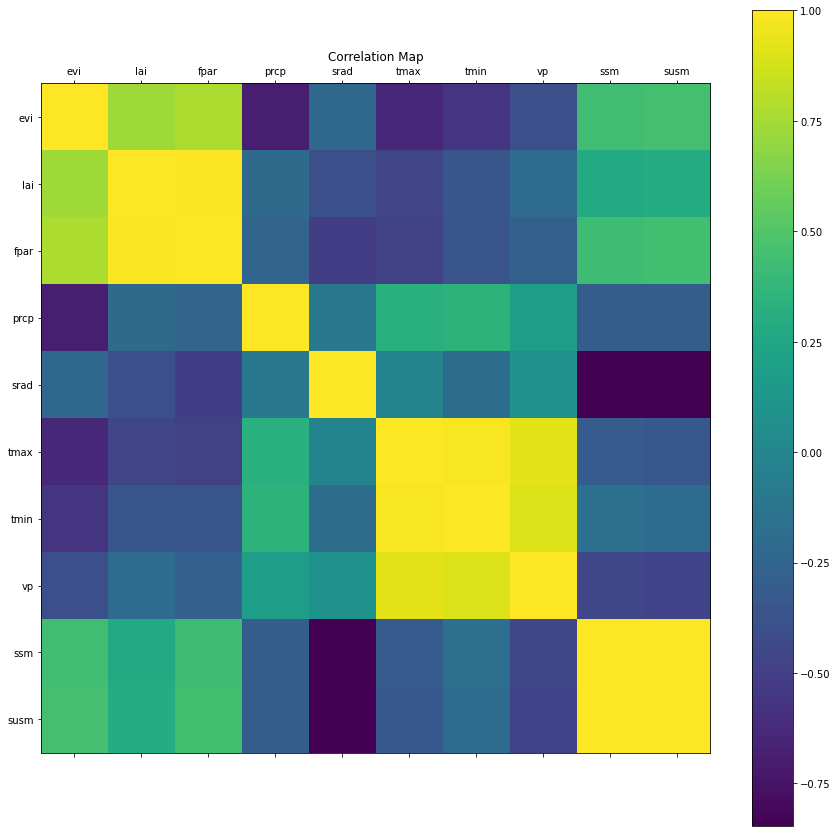

In [11]:
plt_corr(df_filtered.iloc[:,0:],size=(15,15), save_fig=True, save_path="/Users/alperbalmumcu/Github/pickle/Results/correlation_map.png")
#plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/correlation_map.png")

In [11]:
df_filtered

,evi,lai,fpar,prcp,srad,tmax,tmin,vp,ssm,susm
04-15,0.175767,4.476027,23.645442,0.002799,510.146263,19.323378,1.030639,471.505296,2.306734,8.606266
05-15,0.147366,3.009667,16.458302,0.000000,511.273044,32.359206,12.990310,693.176998,2.313060,8.493533
06-15,0.138030,2.773413,15.413657,0.759882,497.074180,33.964788,16.305146,701.085858,2.206431,8.041070
07-15,0.158512,3.184097,17.261705,0.000000,507.819244,39.806442,22.067677,1025.975533,2.144471,7.708455
08-15,0.155171,4.577355,24.006862,0.441983,474.409474,36.650876,20.427421,928.192511,2.332524,8.612518
09-15,0.168626,3.944117,22.532816,0.007475,450.024511,28.313349,12.839106,564.186227,3.264423,12.873223


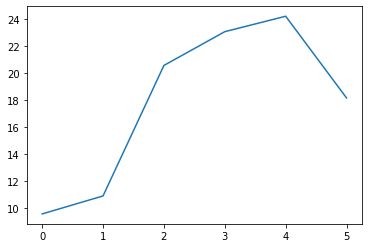

In [37]:
plt.plot(df_full[0][:,8])
plt.show()

In [27]:
df_full[:,:,8].max()

25.112142

In [13]:
max(df_full[-1][:,0])

0.175767

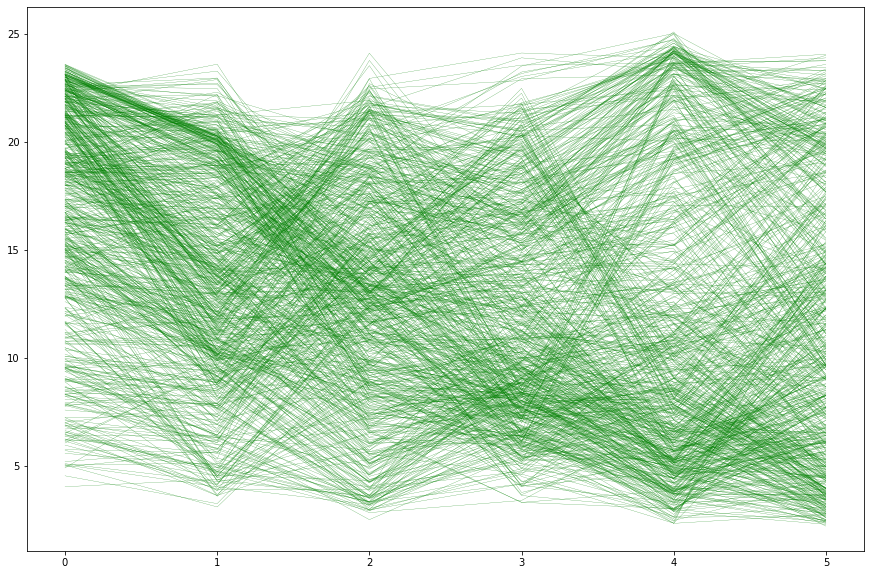

In [41]:
plt.figure(figsize=(15,10))
for idx in range(len(df_full)):
    
    plt.plot(df_full[idx][:,8], 'g', linewidth = 0.2)

# Case 1 - 15th Day

## Train Test Split

In [5]:
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(df_full, yield_full, test_size=0.20, random_state=34)
#X_train_evi, X_val_evi, y_train_evi, y_val_evi = train_test_split(X_train_evi, y_train_evi, test_size=0.10, random_state=34)

print("Train: ", X_train_full.shape)
print("Test: ", X_test_full.shape)
#print("Val: ", X_val_evi.shape)

Train:  (940, 6, 10)
Test:  (235, 6, 10)


## LSTM

In [6]:
LSTM_full.summary()

NameError: name 'LSTM_full' is not defined

In [9]:
LSTM_full = Sequential()
LSTM_full.add(LSTM(100, activation='relu', input_shape=(X_train_full.shape[1], X_train_full.shape[2])))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.001)

LSTM_full.compile(optimizer=optimizer, loss='mse')

history_full_lstm = LSTM_full.fit(X_train_full, y_train_full, epochs=200, batch_size=1)

Epoch 1/200


2023-07-05 11:33:21.872362: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


940/940 [==============================] - 1s 849us/step - loss: 78746.1953
Epoch 2/200
940/940 [==============================] - 1s 827us/step - loss: 66580.9219
Epoch 3/200
940/940 [==============================] - 1s 898us/step - loss: 67596.8906
Epoch 4/200
940/940 [==============================] - 1s 876us/step - loss: 65637.6641
Epoch 5/200
940/940 [==============================] - 1s 869us/step - loss: 64408.6055
Epoch 6/200
940/940 [==============================] - 1s 882us/step - loss: 62471.8750
Epoch 7/200
940/940 [==============================] - 1s 843us/step - loss: 56208.0508
Epoch 8/200
940/940 [==============================] - 1s 858us/step - loss: 59558.3320
Epoch 9/200
940/940 [==============================] - 1s 866us/step - loss: 53980.7891
Epoch 10/200
940/940 [==============================] - 1s 855us/step - loss: 56964.8789
Epoch 11/200
940/940 [==============================] - 1s 841us/step - loss: 55635.7266
Epoch 12/200
940/940 [====================

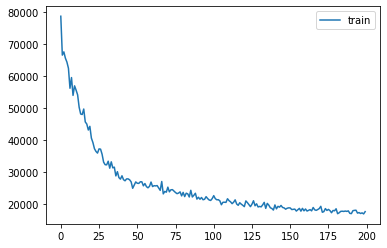

In [10]:
plt.plot(history_full_lstm.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/LSTM/loss.png")
plt.show()

In [11]:
score = LSTM_full.evaluate(X_test_full, y_test_full, batch_size=1)


235/235 [==============================] - 0s 414us/step - loss: 23686.7715


In [12]:
pred_lstm_full = LSTM_full.predict(X_test_full) 
pred_train_lstm_full = LSTM_full.predict(X_train_full)

30/30 [==============================] - 0s 1ms/step


In [13]:
pred_train_lstm_full.shape
pred_lstm_full.shape

(235, 1)

In [14]:
rmse_lstm_full = np.sqrt(mean_squared_error(y_test_full, pred_lstm_full)) 
print("RMSE: %f" % (rmse_lstm_full)) 


RMSE: 153.905058


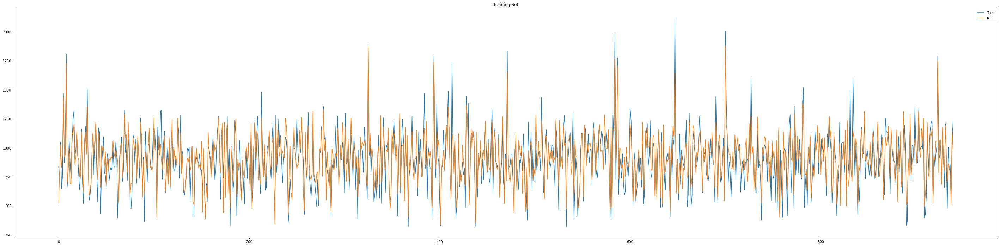

Training Set R-Square= 0.745561818207202


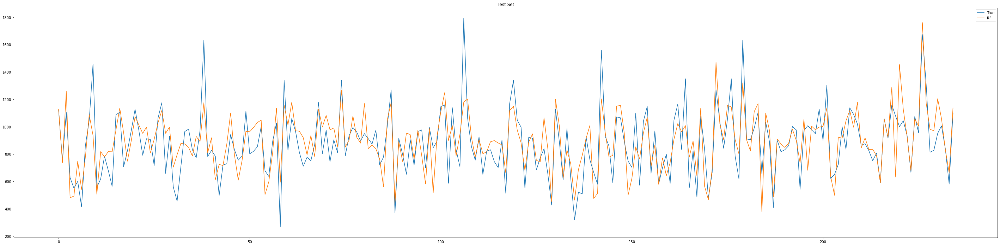

Test Set R-Square= 0.5864117532925439


In [15]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/LSTM/training.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full ,pred_train_lstm_full)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/LSTM/test.png")

plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_full,pred_lstm_full)
print("Test Set R-Square=", rf_indices_r2_test)

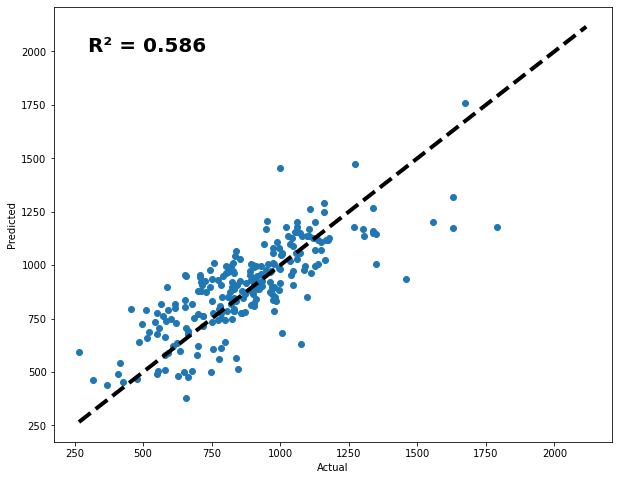

In [16]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full, pred_lstm_full)
ax.plot([yield_full.min(), yield_full.max()], [yield_full.min(), yield_full.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full, pred_lstm_full)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/LSTM/r2.png")
plt.show()


## MLP

In [ ]:
MLP_full.summary()

In [17]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

MLP_full = Sequential()
MLP_full.add(Flatten(input_shape=(X_train_full.shape[1],X_train_full.shape[2])))
MLP_full.add(Dense(128, activation="relu"))
#MLP_full.add(Dropout(0.2))
MLP_full.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full.add(Dense(8, activation="relu"))
MLP_full.add(Dense(1, activation="linear"))

MLP_full.compile(loss='mse', optimizer=Adam(lr=1e-3))#,decay=1e-3 / 200))

history_MLP_full = MLP_full.fit(X_train_full, y_train_full, epochs=200, batch_size=1)


Epoch 1/200
940/940 [==============================] - 1s 456us/step - loss: 75963.5781
Epoch 2/200
940/940 [==============================] - 0s 444us/step - loss: 57115.2031
Epoch 3/200
940/940 [==============================] - 0s 447us/step - loss: 51195.4258
Epoch 4/200
940/940 [==============================] - 0s 443us/step - loss: 49415.9727
Epoch 5/200
940/940 [==============================] - 0s 441us/step - loss: 47843.6992
Epoch 6/200
940/940 [==============================] - 0s 434us/step - loss: 48676.7695
Epoch 7/200
940/940 [==============================] - 0s 425us/step - loss: 43807.3906
Epoch 8/200
940/940 [==============================] - 0s 429us/step - loss: 40624.1836
Epoch 9/200
940/940 [==============================] - 0s 427us/step - loss: 39174.2656
Epoch 10/200
940/940 [==============================] - 0s 443us/step - loss: 36689.4023
Epoch 11/200
940/940 [==============================] - 0s 452us/step - loss: 36182.1016
Epoch 12/200
940/940 [========

In [18]:
pred_train_mlp_full = MLP_full.predict(X_train_full)
pred_test_mlp_full = MLP_full.predict(X_test_full)

8/8 [==============================] - 0s 399us/step


In [19]:
rmse_mlp_full = np.sqrt(mean_squared_error(y_test_full, pred_test_mlp_full)) 
print("RMSE: %f" % (rmse_mlp_full)) 

RMSE: 153.304831


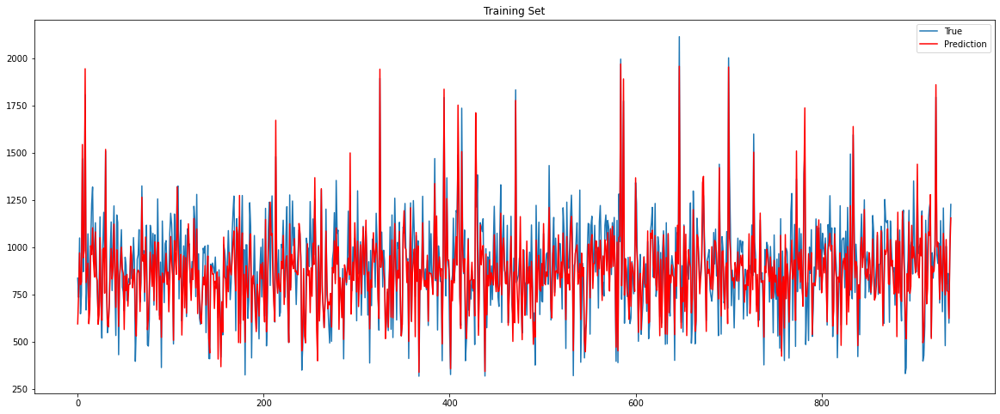

Training Set R-Square= 0.7352232358893751


In [20]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full))
plt.plot(pred_train_mlp_full,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_full,pred_train_mlp_full)
print("Training Set R-Square=", mlp_indices_r2_train)

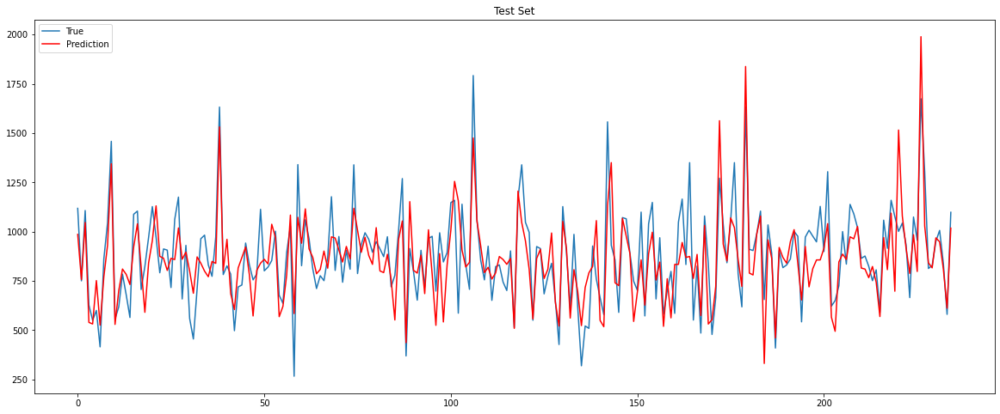

Test Set R-Square= 0.5896314364527242


In [21]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full))
plt.plot(pred_test_mlp_full,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_full,pred_test_mlp_full)
print("Test Set R-Square=", mlp_indices_r2_test)


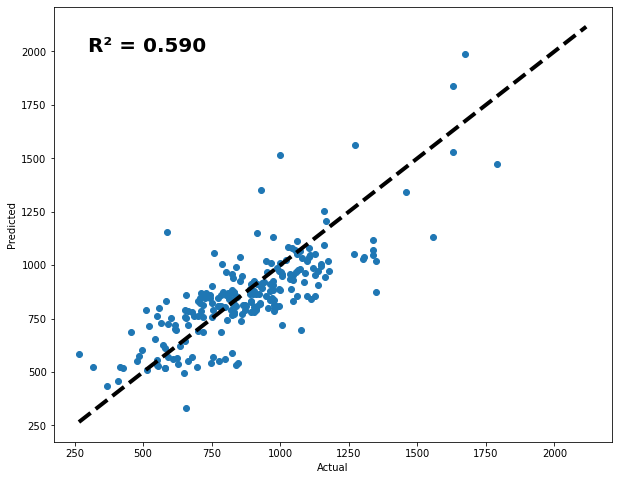

In [22]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full, pred_test_mlp_full)
ax.plot([yield_full.min(), yield_full.max()], [yield_full.min(), yield_full.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full, pred_test_mlp_full)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/MLP/r2.png")
plt.show()


## Random Forest

In [23]:
from sklearn.ensemble import RandomForestRegressor
regr_full = RandomForestRegressor(n_estimators=100, criterion='squared_error',random_state=34,max_features=6)

regr_full.fit(X_train_full.reshape(X_train_full.shape[0],-1), y_train_full)

RandomForestRegressor(max_features=6, random_state=34)

In [24]:
rf_pred_train_full = regr_full.predict(X_train_full.reshape(X_train_full.shape[0],-1))
rf_pred_test_full = regr_full.predict(X_test_full.reshape(X_test_full.shape[0],-1))

In [25]:
rf_pred_train_full.shape

(940,)

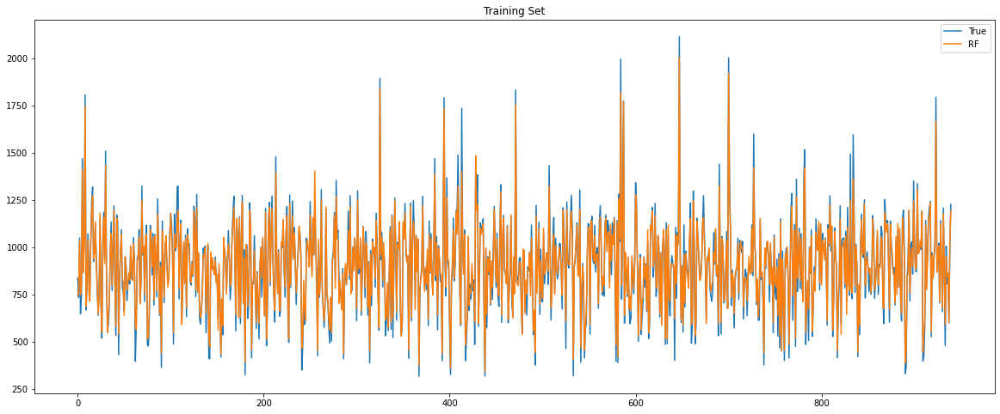

Training Set R-Square= 0.9590325679433076


In [26]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full))
# plt.plot(pred_train_mlp)
plt.plot(rf_pred_train_full)

plt.title("Average WFV predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full,rf_pred_train_full)
print("Training Set R-Square=", rf_indices_r2_train)

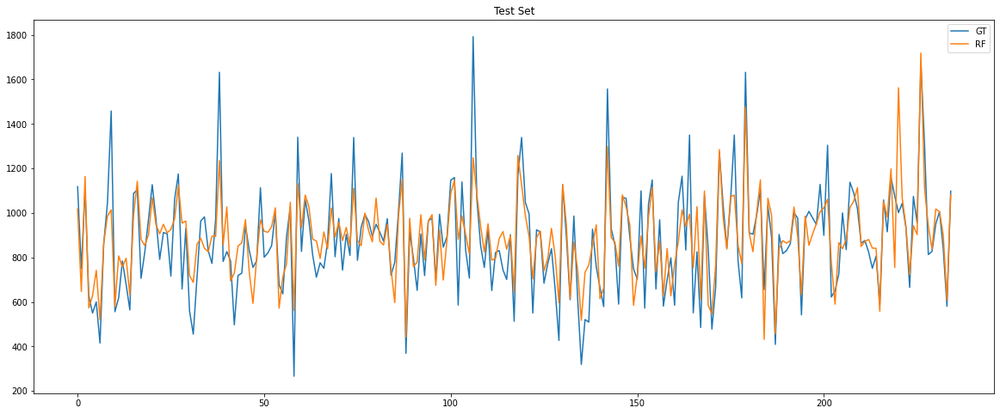

Test Set R-Square= 0.6938804113610497


In [28]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full))
plt.plot(rf_pred_test_full)
plt.title("Average WFV predictions on test data")
plt.legend(["GT", "RF","MLP"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test = r2_score(y_test_full,rf_pred_test_full)
print("Test Set R-Square=", rf_indices_r2_test)

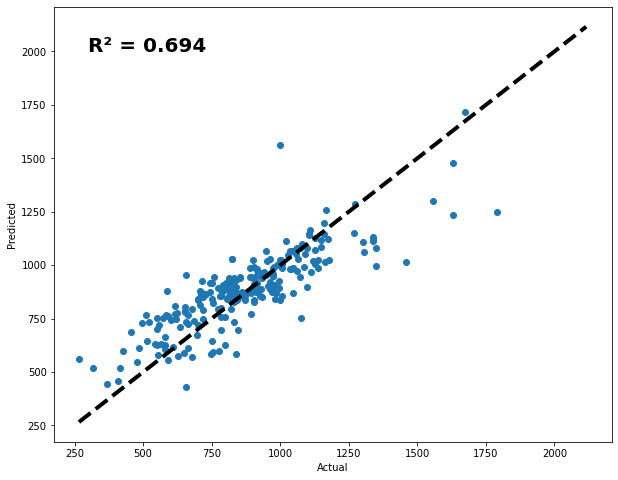

In [29]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full, rf_pred_test_full)
ax.plot([yield_full.min(), yield_full.max()], [yield_full.min(), yield_full.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full, rf_pred_test_full)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/RandomForest/r2.png")
plt.show()


## XGBOOST

In [6]:
xg_reg_full = xgb.XGBRegressor(objective ='reg:squarederror') 
model_= xg_reg_full.fit(X_train_full.reshape(X_train_full.shape[0],-1),y_train_full) 

In [31]:
pred_xgb_full = xg_reg_full.predict(X_test_full.reshape(X_test_full.shape[0],-1))
pred_train_xgb_full = xg_reg_full.predict(X_train_full.reshape(X_train_full.shape[0],-1))


In [32]:
rmse_xgb_full = np.sqrt(mean_squared_error(y_test_full, pred_xgb_full)) 

print("RMSE: %f" % (rmse_xgb_full)) 

RMSE: 141.586718


In [7]:
fig, ax = plt.subplots(figsize=(500, 150))
xgb.plot_tree(model_, num_trees=0, ax=ax)
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/xgb.png")
plt.show()

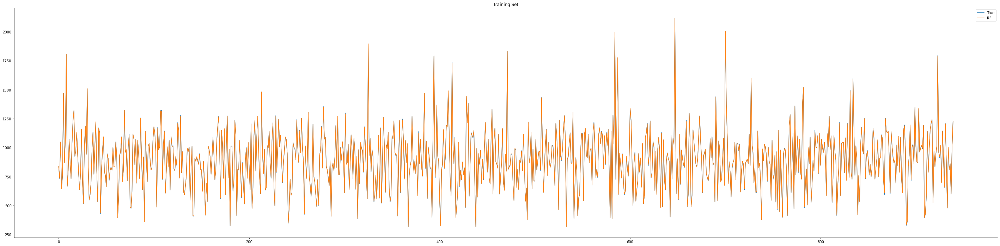

Training Set R-Square= 0.9998110277738483


In [34]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_full,pred_train_xgb_full)
print("Training Set R-Square=", rf_indices_r2_train_full)

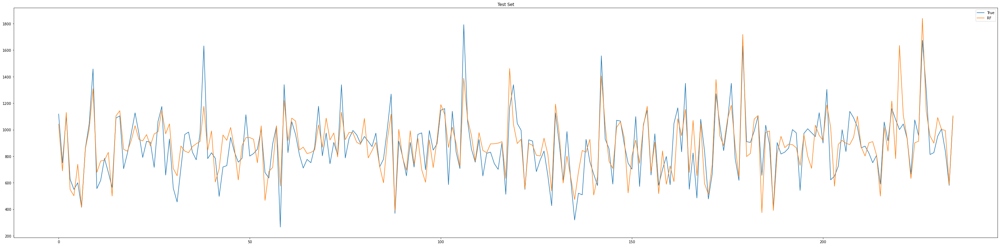

Test Set R-Square= 0.6499682586121382


In [35]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_full,pred_xgb_full)
print("Test Set R-Square=", rf_indices_r2_test_full)

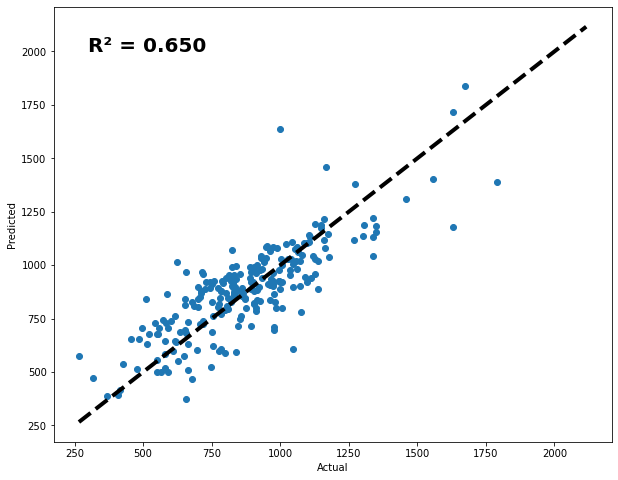

In [36]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full, pred_xgb_full)
ax.plot([yield_full.min(), yield_full.max()], [yield_full.min(), yield_full.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full, pred_xgb_full)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/xgboost/r2.png")
plt.show()



# Case 2 - 10 + 15 days

## Train Test Split

In [39]:
X_train_full_16, X_test_full_16, y_train_full_16, y_test_full_16 = train_test_split(df_full_15_16, yield_full_15_16, test_size=0.20, random_state=34)
#X_train_evi, X_val_evi, y_train_evi, y_val_evi = train_test_split(X_train_evi, y_train_evi, test_size=0.10, random_state=34)

print("Train: ", X_train_full_16.shape)
print("Test: ", X_test_full_16.shape)
#print("Val: ", X_val_evi.shape)

Train:  (1880, 6, 10)
Test:  (470, 6, 10)


## LSTM

In [40]:
LSTM_full_16 = Sequential()
LSTM_full_16.add(LSTM(100, activation='relu', input_shape=(X_train_full_16.shape[1], X_train_full_16.shape[2])))
LSTM_full_16.add(Dense(1))

optimizer = Adam(lr=0.001)

LSTM_full_16.compile(optimizer=optimizer, loss='mse')

history_full_lstm_16 = LSTM_full_16.fit(X_train_full_16, y_train_full_16, epochs=200, batch_size=1)

Epoch 1/200
1880/1880 [==============================] - 2s 858us/step - loss: 76035.2031
Epoch 2/200
1880/1880 [==============================] - 2s 834us/step - loss: 59065.5977
Epoch 3/200
1880/1880 [==============================] - 2s 862us/step - loss: 55421.6055
Epoch 4/200
1880/1880 [==============================] - 2s 831us/step - loss: 52773.1797
Epoch 5/200
1880/1880 [==============================] - 2s 835us/step - loss: 51726.2422
Epoch 6/200
1880/1880 [==============================] - 2s 829us/step - loss: 48830.9961
Epoch 7/200
1880/1880 [==============================] - 2s 832us/step - loss: 46383.1953
Epoch 8/200
1880/1880 [==============================] - 2s 839us/step - loss: 46515.9844
Epoch 9/200
1880/1880 [==============================] - 2s 839us/step - loss: 44083.0430
Epoch 10/200
1880/1880 [==============================] - 2s 827us/step - loss: 47835.2344
Epoch 11/200
1880/1880 [==============================] - 2s 829us/step - loss: 41997.3906
Epoch 12

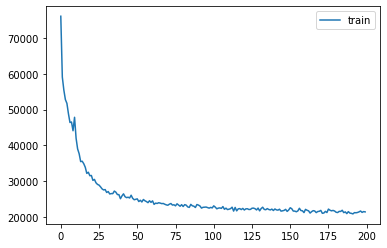

In [41]:
plt.plot(history_full_lstm_16.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case4/LSTM/loss.png")
plt.show()

In [42]:
score = LSTM_full_16.evaluate(X_test_full_16, y_test_full_16, batch_size=1)

470/470 [==============================] - 0s 404us/step - loss: 24272.1484


In [43]:
pred_lstm_full_16 = LSTM_full_16.predict(X_test_full_16) 
pred_train_lstm_full_16 = LSTM_full_16.predict(X_train_full_16)

59/59 [==============================] - 0s 1ms/step


In [44]:
pred_train_lstm_full_16.shape
pred_lstm_full_16.shape

(470, 1)

In [45]:
rmse_lstm_full_16 = np.sqrt(mean_squared_error(y_test_full_16, pred_lstm_full_16)) 
print("RMSE: %f" % (rmse_lstm_full_16)) 

RMSE: 155.795160


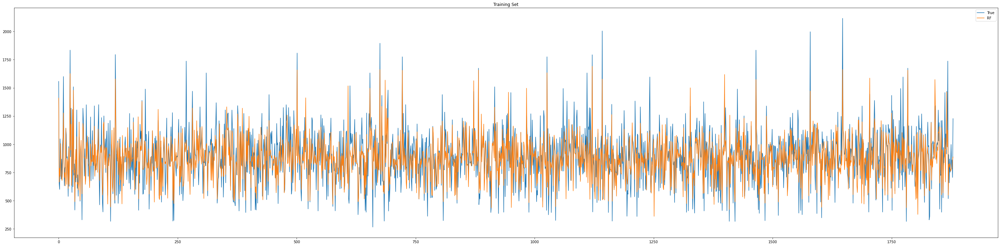

Training Set R-Square= 0.6610716534810995


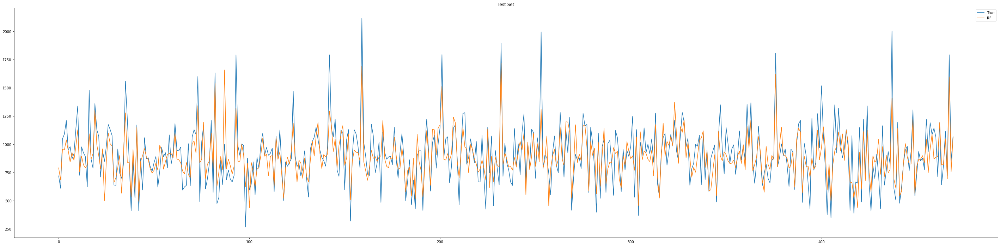

Test Set R-Square= 0.6603273523086133


In [46]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full_16))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full_16 ,pred_train_lstm_full_16)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full_16))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_full_16,pred_lstm_full_16)
print("Test Set R-Square=", rf_indices_r2_test)

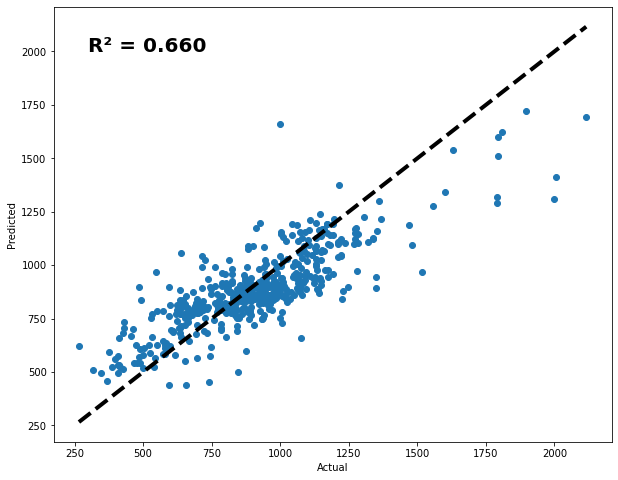

In [47]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_16, pred_lstm_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_16, pred_lstm_full_16)),  (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case4/LSTM/r2.png")

plt.show()

In [ ]:
plt.figure(figsize=(15,10))
for i in range(X_test_full_16.shape[0]):
    plt.plot(df_filtered.index,X_test_full_16[i][:,6], 'g-', linewidth = 0.4)

## MLP

In [48]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

MLP_full_16 = Sequential()
MLP_full_16.add(Flatten(input_shape=(X_train_full_16.shape[1],X_train_full_16.shape[2])))
MLP_full_16.add(Dense(128, activation="relu"))
#MLP_full.add(Dropout(0.2))
MLP_full_16.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_16.add(Dense(8, activation="relu"))
MLP_full_16.add(Dense(1, activation="linear"))

MLP_full_16.compile(loss='mse', optimizer=Adam(lr=1e-3))#,decay=1e-3 / 200))

history_MLP_full_16 = MLP_full_16.fit(X_train_full_16, y_train_full_16, epochs=200, batch_size=1)


Epoch 1/200
1880/1880 [==============================] - 1s 433us/step - loss: 67919.0469
Epoch 2/200
1880/1880 [==============================] - 1s 431us/step - loss: 49308.6953
Epoch 3/200
1880/1880 [==============================] - 1s 434us/step - loss: 43260.4141
Epoch 4/200
1880/1880 [==============================] - 1s 432us/step - loss: 42018.7305
Epoch 5/200
1880/1880 [==============================] - 1s 429us/step - loss: 38068.1523
Epoch 6/200
1880/1880 [==============================] - 1s 432us/step - loss: 36472.4375
Epoch 7/200
1880/1880 [==============================] - 1s 430us/step - loss: 36168.4883
Epoch 8/200
1880/1880 [==============================] - 1s 428us/step - loss: 33620.0664
Epoch 9/200
1880/1880 [==============================] - 1s 432us/step - loss: 32168.5449
Epoch 10/200
1880/1880 [==============================] - 1s 526us/step - loss: 32554.2227
Epoch 11/200
1880/1880 [==============================] - 1s 431us/step - loss: 31152.2207
Epoch 12

In [49]:
pred_train_mlp_full_16 = MLP_full_16.predict(X_train_full_16)
pred_test_mlp_full_16 = MLP_full_16.predict(X_test_full_16)

15/15 [==============================] - 0s 487us/step


In [50]:
rmse_mlp_full_16 = np.sqrt(mean_squared_error(y_test_full_16, pred_test_mlp_full_16)) 
print("RMSE: %f" % (rmse_mlp_full_16)) 

RMSE: 151.055464


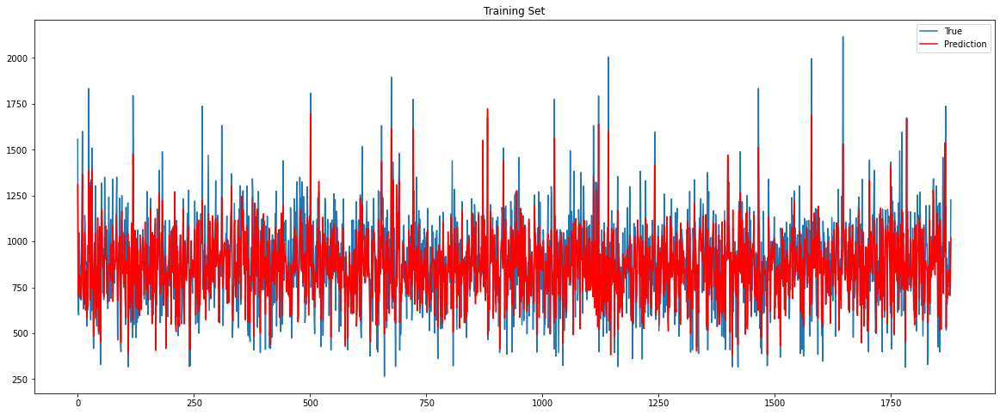

Training Set R-Square= 0.7131094370908014


In [51]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full_16))
plt.plot(pred_train_mlp_full_16,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_full_16,pred_train_mlp_full_16)
print("Training Set R-Square=", mlp_indices_r2_train)

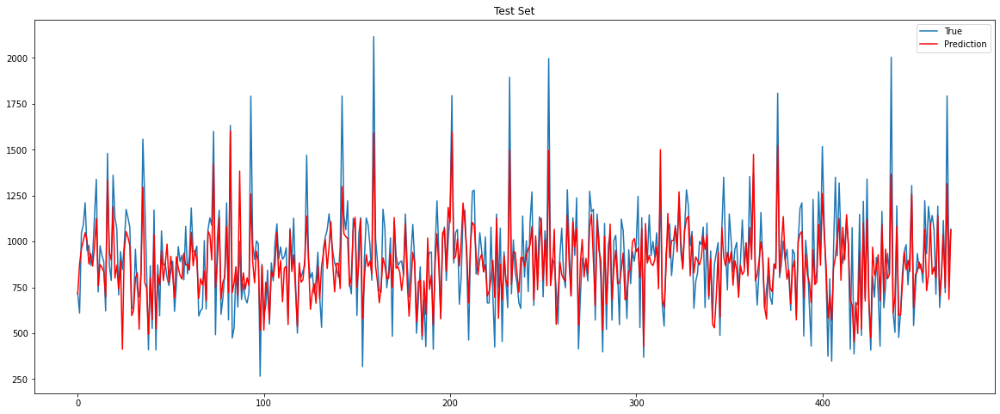

Test Set R-Square= 0.6806804328243552


In [52]:

plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full_16))
plt.plot(pred_test_mlp_full_16,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_full_16,pred_test_mlp_full_16)
print("Test Set R-Square=", mlp_indices_r2_test)


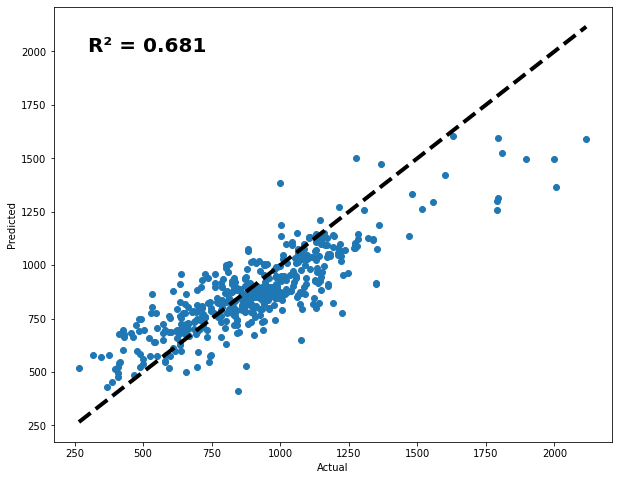

In [53]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_16, pred_test_mlp_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_16, pred_test_mlp_full_16)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case4/MLP/r2.png")
plt.show()


## Random Forest

In [54]:
from sklearn.ensemble import RandomForestRegressor
regr_full_16 = RandomForestRegressor(n_estimators=100, criterion='squared_error',random_state=34,max_features=6)

regr_full_16.fit(X_train_full_16.reshape(X_train_full_16.shape[0],-1), y_train_full_16)

RandomForestRegressor(max_features=6, random_state=34)

In [55]:
rf_pred_train_full_16 = regr_full_16.predict(X_train_full_16.reshape(X_train_full_16.shape[0],-1))
rf_pred_test_full_16 = regr_full_16.predict(X_test_full_16.reshape(X_test_full_16.shape[0],-1))

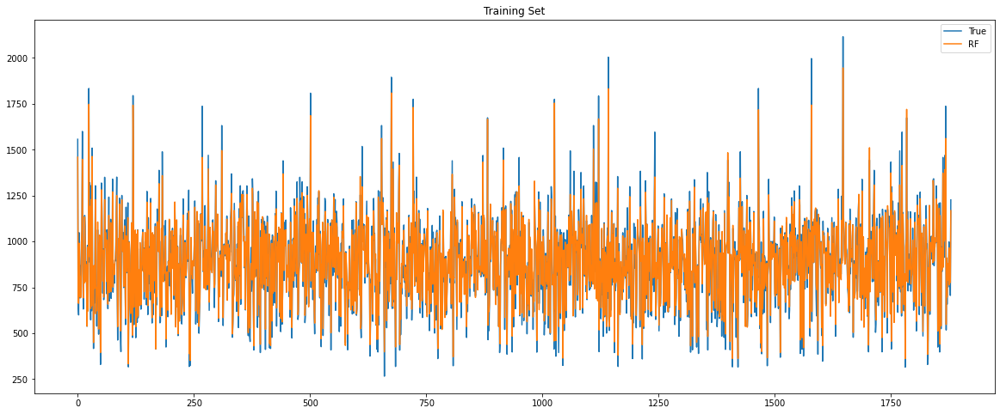

Training Set R-Square= 0.9619700167033547


In [56]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full_16))
# plt.plot(pred_train_mlp)
plt.plot(rf_pred_train_full_16)

plt.title("Average WFV predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full_16,rf_pred_train_full_16)
print("Training Set R-Square=", rf_indices_r2_train)

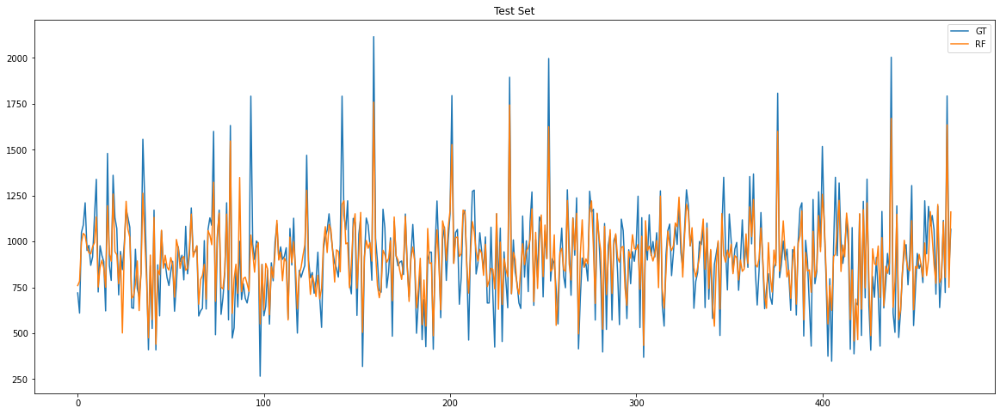

Test Set R-Square= 0.7631143412711285


In [58]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full_16))
plt.plot(rf_pred_test_full_16)
#plt.plot(pred_test_mlp_16)
plt.title("Average WFV predictions on test data")
plt.legend(["GT", "RF","MLP"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test = r2_score(y_test_full_16,rf_pred_test_full_16)
print("Test Set R-Square=", rf_indices_r2_test)

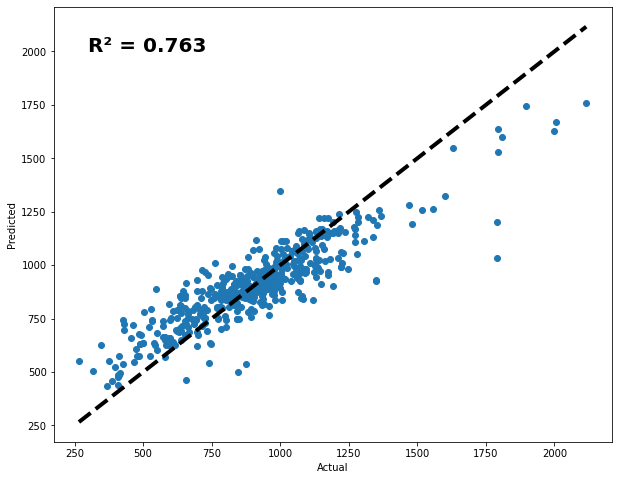

In [59]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_16, rf_pred_test_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_16, rf_pred_test_full_16)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case4/RandomForest/r2.png")

plt.show()



### SHAP

In [121]:
import shap

explainer_rand_full = shap.Explainer(regr_full_16)
X_test_full_reshaped = X_test_full_16.reshape((X_test_full_16.shape[0], -1))
shap_values_xgb_full = explainer_rand_full.shap_values(X_test_full_reshaped)


In [228]:
shap_values_reshaped = shap_values_xgb_full.reshape((X_test_full_16.shape[0], 6, -1))



mean_shap_values = np.abs(np.mean(shap_values_reshaped[:,:,0], axis=0))

# Sort the mean Shap values in descending order
#sorted_indices = np.argsort(mean_shap_values)[::-1]
#sorted_values = mean_shap_values[sorted_indices]

In [232]:
shap_values_reshaped[:,:,0]

array([[  0.43417104,   2.40527884, -23.83892187, -33.21828759,
        -47.0374887 ,  -3.58537342],
       [ -2.0938316 ,  -5.72164063, -24.88033941,   2.24986964,
        -39.86614897,   1.45131231],
       [  2.12442904,  -3.35425477, -35.32434603, -45.56406864,
        -49.17739067,  -4.64913208],
       ...,
       [ 11.54088639,   6.3311404 ,   5.65908196,  11.4672644 ,
         15.52831119,   2.10385433],
       [ -1.38726924,  -1.15392425,  -4.69859426,  -2.49979936,
         11.56788486,  -0.11563285],
       [ -6.25861001,  -1.9596291 ,   0.41219221,  -5.64241316,
          9.62985701,  -1.23658333]])

In [214]:
mean_shap_values

array([0.79452168, 0.8475858 , 0.13115412, 1.49880249, 0.87761125,
       0.68183517])

In [124]:
df_filtered

,evi,lai,fpar,prcp,srad,tmax,tmin,vp,ssm,susm
04-15,0.175767,4.476027,23.645442,0.002799,510.146263,19.323378,1.030639,471.505296,2.306734,8.606266
05-15,0.147366,3.009667,16.458302,0.000000,511.273044,32.359206,12.990310,693.176998,2.313060,8.493533
06-15,0.138030,2.773413,15.413657,0.759882,497.074180,33.964788,16.305146,701.085858,2.206431,8.041070
07-15,0.158512,3.184097,17.261705,0.000000,507.819244,39.806442,22.067677,1025.975533,2.144471,7.708455
08-15,0.155171,4.577355,24.006862,0.441983,474.409474,36.650876,20.427421,928.192511,2.332524,8.612518
09-15,0.168626,3.944117,22.532816,0.007475,450.024511,28.313349,12.839106,564.186227,3.264423,12.873223


In [125]:
shap_values_reshaped[:,:,0].mean()

-0.028727916015199778

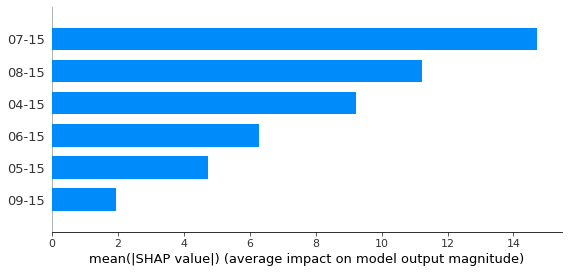

In [296]:
summary_plot = shap.summary_plot(shap_values_reshaped[:,:,2], plot_type="bar", feature_names=df_filtered.index)

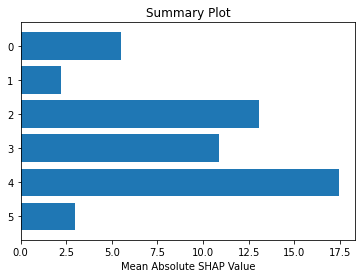

In [234]:
# Generate some sample data
shap_values = shap_values_reshaped[:,:,0]

# Calculate the mean absolute shap values
mean_abs_shap = np.abs(shap_values).mean(axis=0)

# Create the summary plot
fig, ax = plt.subplots()
ax.barh(range(len(mean_abs_shap)), mean_abs_shap, align='center')
ax.set_yticks(range(len(mean_abs_shap)))
ax.set_yticklabels(range(len(mean_abs_shap)))
ax.invert_yaxis()
ax.set_xlabel('Mean Absolute SHAP Value')
ax.set_title('Summary Plot')
plt.show()

In [227]:
mean_values = []  # List to store the mean values

for i in range(6):
    mean = shap_values_reshaped[:, i, 0].mean()
    mean_values.append(mean)

print(mean_values)

[0.9028256817012282, -0.14560604289029586, -1.044234818031855, -0.19957634147112766, 0.18548311992724426, 0.1287409046736071]


In [190]:
summary_plot = shap.plots.waterfall(shap_values_reshaped[:,:,0])#,feature_names=df_filtered.index)

AttributeError: 'numpy.ndarray' object has no attribute 'base_values'

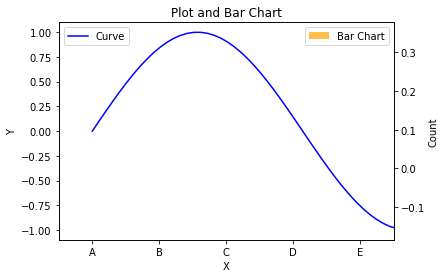

In [192]:
import numpy as np
import matplotlib.pyplot as plt

# Generate data for the plot
x = np.linspace(0, 10, 100)
y = np.sin(x)

# Generate data for the bar chart
labels = ['A', 'B', 'C', 'D', 'E']
values = [15, 30, 10, 20, 25]

# Create the figure and axes
fig, ax1 = plt.subplots()

# Plot the curve
ax1.plot(x, y, color='blue', label='Curve')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_title('Plot and Bar Chart')

# Create the bar chart
ax2 = ax1.twinx()
ax2.bar((len(mean_values)), mean_values, color='orange', alpha=0.7, width=0.4)

# Adjust the x-axis ticks and labels
ax2.set_xticks(np.arange(len(labels)))
ax2.set_xticklabels(labels)

# Center the labels
ax2.set_xlim([-0.5, len(labels) - 0.5])

# Set the y-axis label for the bar chart
ax2.set_ylabel('Count')

# Add a legend
ax1.legend(loc='upper left')
ax2.legend(['Bar Chart'], loc='upper right')

# Show the plot
plt.show()


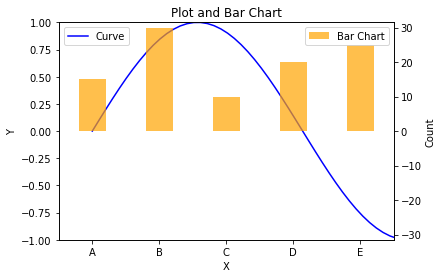

In [129]:
import numpy as np
import matplotlib.pyplot as plt

# Generate data for the plot
x = np.linspace(0, 10, 100)
y = np.sin(x)

# Generate data for the bar chart
labels = ['A', 'B', 'C', 'D', 'E']
values = [15, 30, 10, 20, 25]

# Create the figure and axes
fig, ax1 = plt.subplots()

# Plot the curve
ax1.plot(x, y, color='blue', label='Curve')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_title('Plot and Bar Chart')

# Create the bar chart
ax2 = ax1.twinx()
ax2.bar(np.arange(len(values)), values, color='orange', alpha=0.7, width=0.4)

# Adjust the x-axis ticks and labels
ax2.set_xticks(np.arange(len(labels)))
ax2.set_xticklabels(labels)

# Center the labels
ax2.set_xlim([-0.5, len(labels) - 0.5])

# Calculate the y-axis limits for the plot and bar chart
plot_ylim = ax1.get_ylim()
bar_ylim = ax2.get_ylim()
y_min = min(plot_ylim[0], bar_ylim[0])
y_max = max(plot_ylim[1], bar_ylim[1])
ax1.set_ylim([-1, 1])
ax2.set_ylim([-y_max, y_max])

# Set the y-axis label for the bar chart
ax2.set_ylabel('Count')

# Add a legend
ax1.legend(loc='upper left')
ax2.legend(['Bar Chart'], loc='upper right')

# Show the plot
plt.show()

### SHAP - PLT

#### EVI

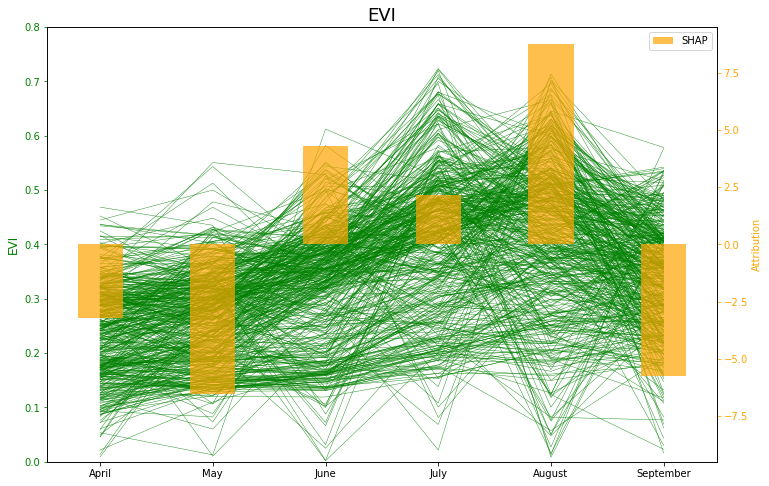

In [275]:
import numpy as np
import matplotlib.pyplot as plt

#plt.figure(figsize=(15,10))

dates = ["April", "May", "June", "July", "August","September"]
# Create the figure and axes
fig, ax1 = plt.subplots(figsize=(12,8))

# Plot the curve
for idx in range(len(X_test_full_16)):
    
    ax1.plot(dates,X_test_full_16[idx][:,0], 'g', linewidth = 0.4) #df_filtered.index 
#ax1.set_xlabel('Dates', fontsize=16)
ax1.set_ylabel('EVI', fontsize=16)
#ax1.set_title('Plot and Bar Chart')

ax1.title.set_fontsize(18)
ax1.xaxis.label.set_fontsize(12)
ax1.yaxis.label.set_fontsize(12)

mean_abs_shap_centered = mean_abs_shap - mean_abs_shap.max() / 2

# Create the bar chart
ax2 = ax1.twinx()
ax2.bar(range(len(mean_abs_shap_centered)), mean_abs_shap_centered, color='orange', alpha=0.7, width=0.4)
ax2.yaxis.label.set_color('orange')
ax1.xaxis.label.set_fontsize(15)
ax2.tick_params(axis='y', colors='orange')

ax1.yaxis.label.set_color('green')
ax1.tick_params(axis='y', colors='green')


plot_ylim = ax1.get_ylim()
bar_ylim = ax2.get_ylim()
y_min = min(plot_ylim[0], bar_ylim[0])
y_max = max(plot_ylim[1], bar_ylim[1])
ax1.set_ylim([0, 0.8])
ax2.set_ylim([-y_max, y_max])



# Set the y-axis label for the bar chart
ax2.set_ylabel('Attribution')

# Add a legend
ax2.legend(['SHAP'], loc='upper right')
plt.title("EVI").set_fontsize(18)

# Show the plot
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/SHAP/Case4_RandomForest/EVI/shap_evi.png")
plt.show()

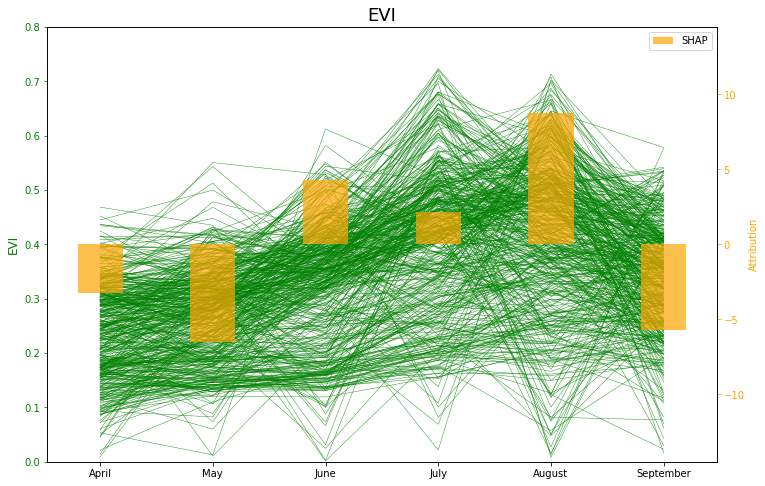

In [299]:
import numpy as np
import matplotlib.pyplot as plt

dates = ["April", "May", "June", "July", "August", "September"]

# Create the figure and axes
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot the curve
for idx in range(len(X_test_full_16)):
    ax1.plot(dates, X_test_full_16[idx][:,0], 'g', linewidth=0.4)

# Set labels and title for ax1
ax1.set_ylabel('EVI', fontsize=16)
ax1.title.set_fontsize(18)
ax1.xaxis.label.set_fontsize(12)
ax1.yaxis.label.set_fontsize(12)
ax1.yaxis.label.set_color('green')
ax1.tick_params(axis='y', colors='green')

# Calculate mean absolute SHAP values
mean_abs_shap_centered = mean_abs_shap - mean_abs_shap.max() / 2

# Create the bar chart
ax2 = ax1.twinx()
ax2.bar(range(len(mean_abs_shap_centered)), mean_abs_shap_centered, color='orange', alpha=0.7, width=0.4)
ax2.yaxis.label.set_color('orange')
ax2.tick_params(axis='y', colors='orange')

# Set labels and limits for ax2
ax2.set_ylabel('Attribution')
plot_ylim = ax1.get_ylim()
bar_ylim = ax2.get_ylim()
y_min = min(plot_ylim[0], bar_ylim[0])
y_max = max(plot_ylim[1], bar_ylim[1])
ax1.set_ylim([0, 0.8])
ax2.set_ylim([-y_max-5, y_max+5])

# Add a legend
ax2.legend(['SHAP'], loc='upper right')

# Set the font size of the title
plt.title("EVI", fontsize=18)

# Save the plot
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/SHAP/Case4_RandomForest/EVI/shap_evi.png")

# Show the plot
plt.show()


In [300]:
def plot_shap(shap_values_reshaped, save_path, feature_number=0,color='green', title='EVI'):
    dates = ["April", "May", "June", "July", "August", "September"]
    
    # Create the figure and axes
    fig, ax1 = plt.subplots(figsize=(12, 8))

    # Plot the curve
    for idx in range(len(X_test_full_16)):
        ax1.plot(dates, X_test_full_16[idx][:,feature_number], color, linewidth=0.4)

    # Set labels and title for ax1
    ax1.set_ylabel(title, fontsize=16)
    ax1.title.set_fontsize(18)
    ax1.xaxis.label.set_fontsize(12)
    ax1.yaxis.label.set_fontsize(12)
    ax1.yaxis.label.set_color(color)
    ax1.tick_params(axis='y', colors=color)

    # Calculate mean absolute SHAP values
    shap_values = shap_values_reshaped[:,:,feature_number]
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    mean_abs_shap_centered = mean_abs_shap - mean_abs_shap.max() / 2

    # Create the bar chart
    ax2 = ax1.twinx()
    ax2.bar(range(len(mean_abs_shap_centered)), mean_abs_shap_centered, color='orange', alpha=1, width=0.4)
    ax2.yaxis.label.set_color('orange')
    ax2.tick_params(axis='y', colors='orange')

    # Set labels and limits for ax2
    ax2.set_ylabel('Attribution')
    plot_ylim = ax1.get_ylim()
    bar_ylim = ax2.get_ylim()
    y_min = min(plot_ylim[0], bar_ylim[0])
    y_max = max(plot_ylim[1], bar_ylim[1])
    ax1.set_ylim([0, X_test_full_16[:,:,feature_number].max()])
    ax2.set_ylim([-bar_ylim[1]-(bar_ylim[1]*0.2), bar_ylim[1]+(bar_ylim[1]*0.2)])

    # Add a legend
    ax2.legend(['SHAP'], loc='upper right')

    # Set the title name
    plt.title(title, fontsize=18)

    # Save the plot
    plt.savefig(save_path)

    # Show the plot
    plt.show()


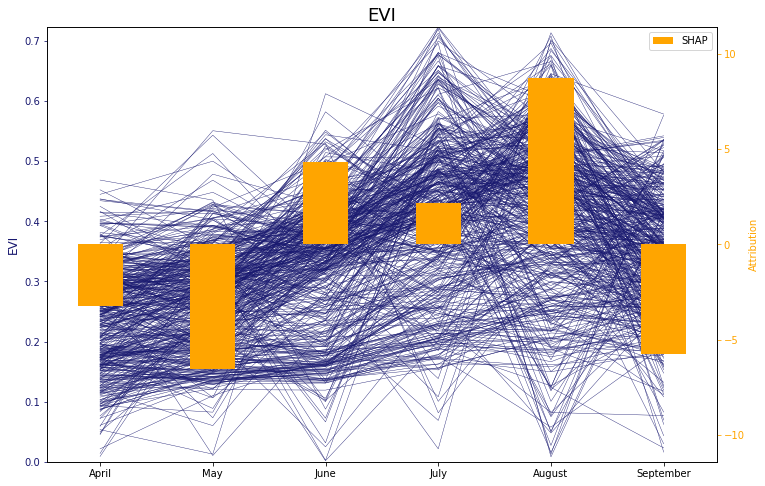

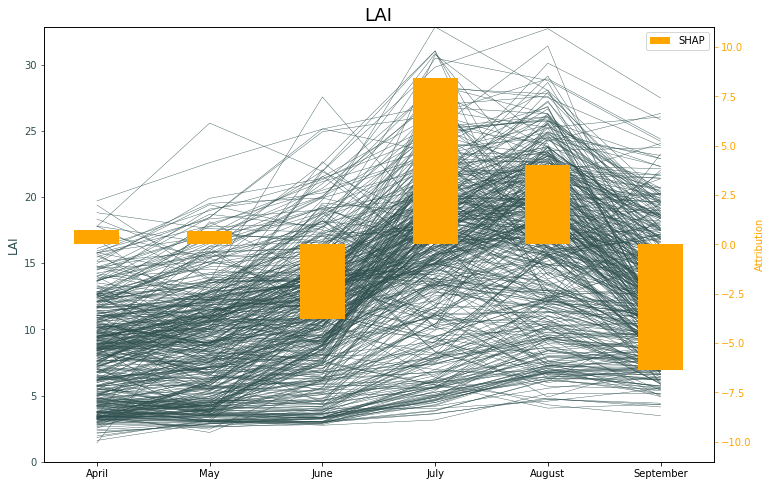

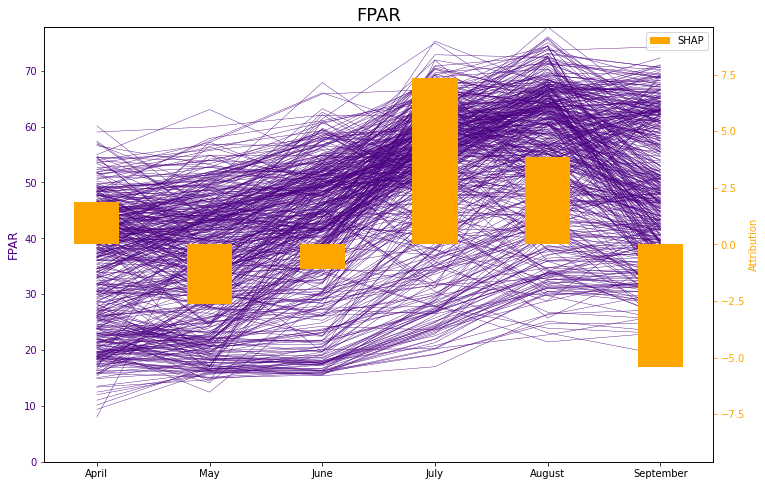

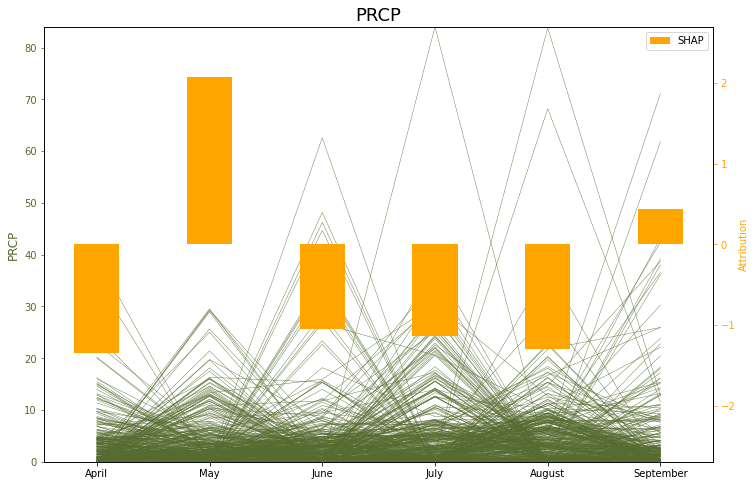

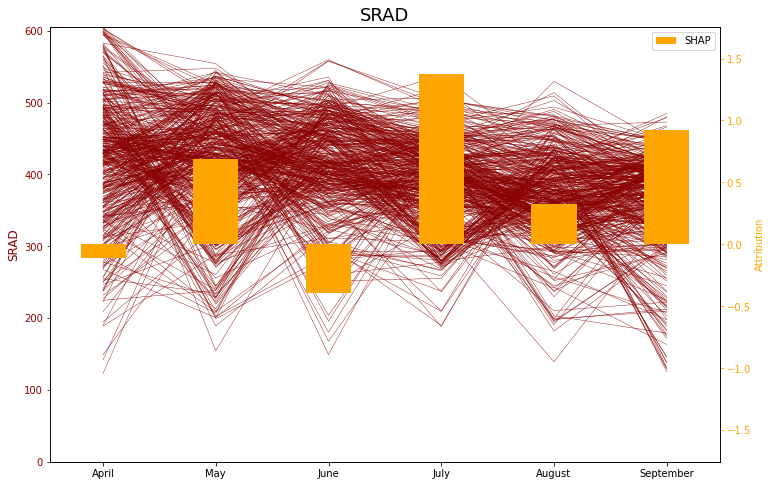

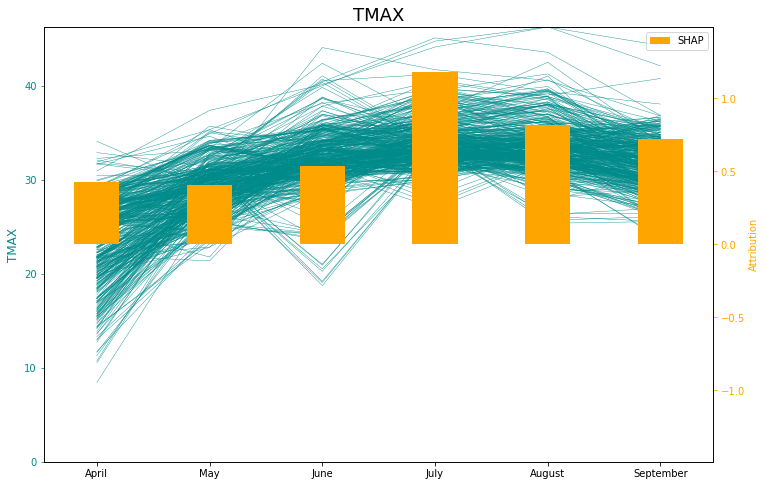

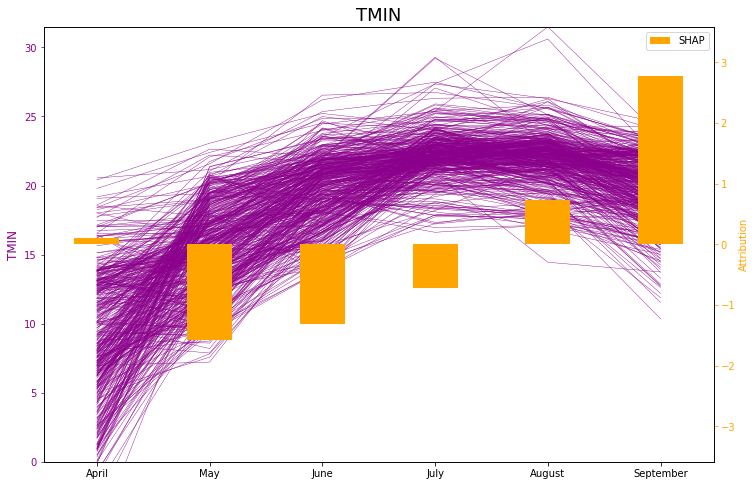

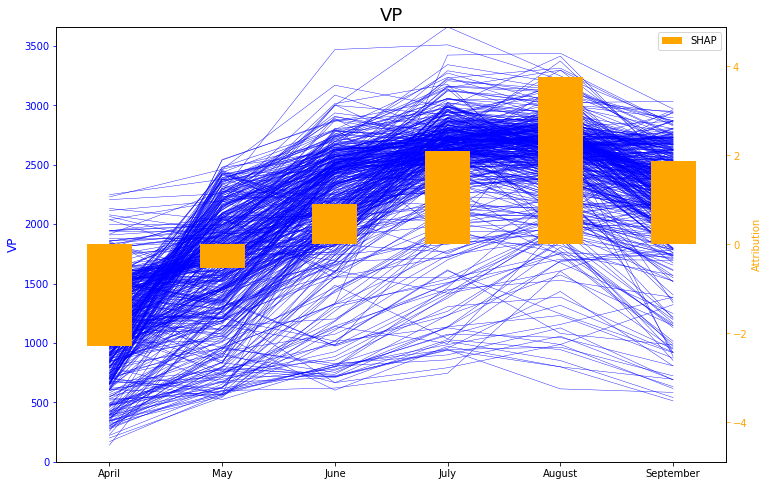

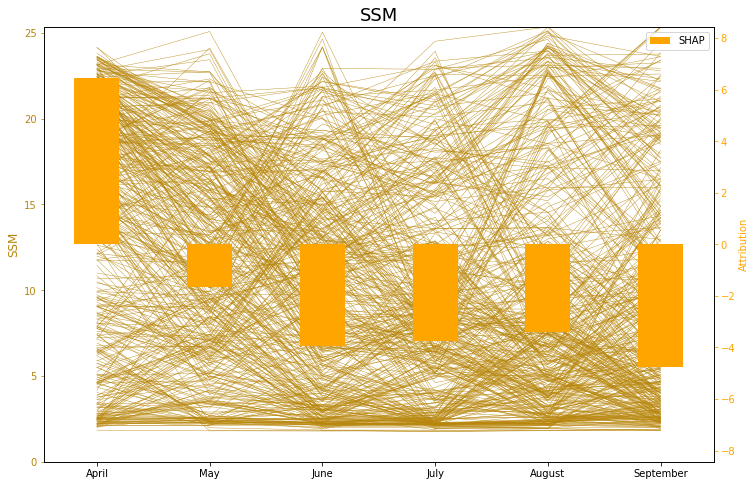

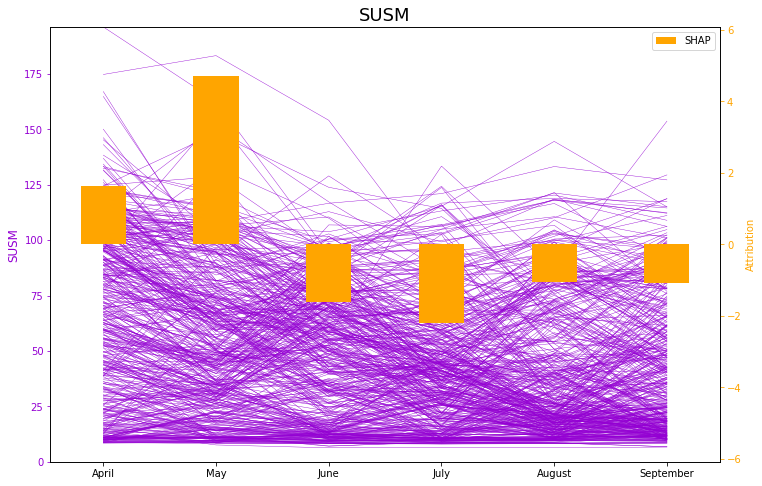

In [302]:
dark_colors = ['midnightblue', 'darkslategray', 'indigo', 'darkolivegreen', 'darkred', 'darkcyan', 'darkmagenta', 'blue', 'darkgoldenrod', 'darkviolet']
text_array = ['EVI', 'LAI', 'FPAR', 'PRCP', 'SRAD', 'TMAX', 'TMIN', 'VP', 'SSM', 'SUSM']

for _i in range(10):
    plot_shap(shap_values_reshaped,
          f"/Users/alperbalmumcu/Github/pickle/Results/SHAP/Case4_RandomForest/{text_array[_i]}/{text_array[_i]}.png",
          feature_number=_i,
          color=dark_colors[_i],
          title=text_array[_i])


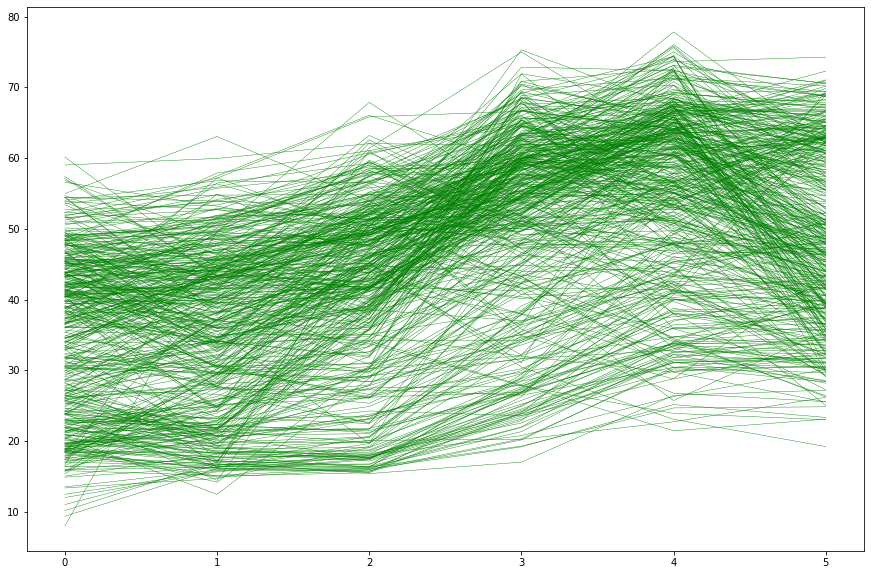

In [288]:
plt.figure(figsize=(15,10))
for idx in range(len(X_test_full_16)):
    
    plt.plot(X_test_full_16[idx][:,2], 'g', linewidth = 0.4)


## XGBOOST

In [60]:
xg_reg_full_16 = xgb.XGBRegressor(objective ='reg:squarederror') 
xg_reg_full_16.fit(X_train_full_16.reshape(X_train_full_16.shape[0],-1),y_train_full_16) 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [61]:
pred_xgb_full_16 = xg_reg_full_16.predict(X_test_full_16.reshape(X_test_full_16.shape[0],-1))
pred_train_xgb_full_16 = xg_reg_full_16.predict(X_train_full_16.reshape(X_train_full_16.shape[0],-1))


In [62]:
rmse_xgb_full = np.sqrt(mean_squared_error(y_test_full_16, pred_xgb_full_16)) 

print("RMSE: %f" % (rmse_xgb_full)) 

RMSE: 135.690695


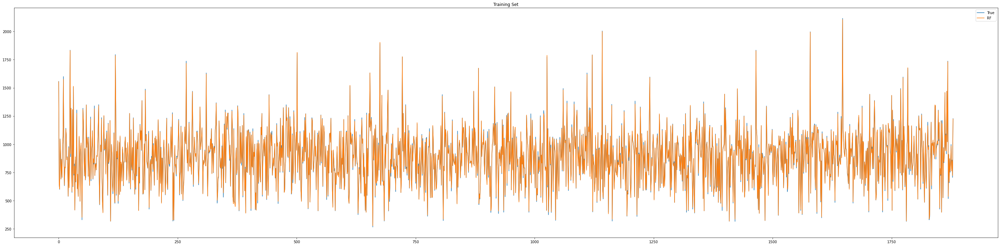

Training Set R-Square= 0.9981734088256853


In [63]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full_16))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_full_16,pred_train_xgb_full_16)
print("Training Set R-Square=", rf_indices_r2_train_full)

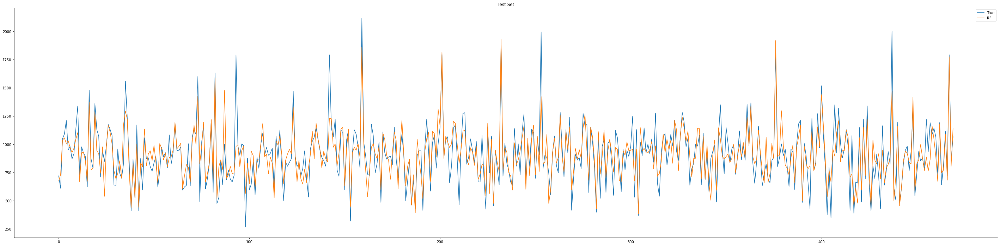

Test Set R-Square= 0.7423365684125854


In [64]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full_16))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_full_16,pred_xgb_full_16)
print("Test Set R-Square=", rf_indices_r2_test_full)

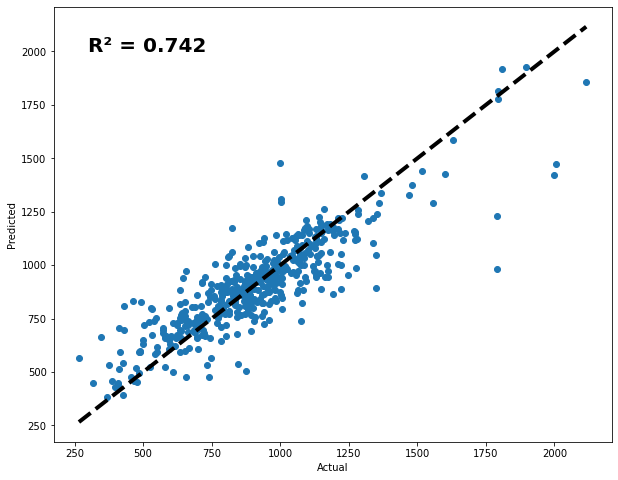

In [65]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_16, pred_xgb_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_16, pred_xgb_full_16)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case4/xgboost/r2.png")

plt.show()


# Case 3 - 10 + 15 + 20 days 

## Train Test Split

In [68]:
X_train_full_14, X_test_full_14, y_train_full_14, y_test_full_14 = train_test_split(df_full_14_15_16, yield_full_14_15_16, test_size=0.20, random_state=34)
#X_train_evi, X_val_evi, y_train_evi, y_val_evi = train_test_split(X_train_evi, y_train_evi, test_size=0.10, random_state=34)

print("Train: ", X_train_full_14.shape)
print("Test: ", X_test_full_14.shape)
#print("Val: ", X_val_evi.shape)

Train:  (2820, 6, 10)
Test:  (705, 6, 10)


## LSTM

In [69]:
LSTM_full_14 = Sequential()
LSTM_full_14.add(LSTM(100, activation='relu', input_shape=(X_train_full_14.shape[1], X_train_full_14.shape[2])))
LSTM_full_14.add(Dense(1))

optimizer = Adam(lr=0.001)

LSTM_full_14.compile(optimizer=optimizer, loss='mse')

history_full_lstm_14 = LSTM_full_14.fit(X_train_full_14, y_train_full_14, epochs=200, batch_size=1)

Epoch 1/200
2820/2820 [==============================] - 3s 977us/step - loss: 73001.6562
Epoch 2/200
2820/2820 [==============================] - 2s 835us/step - loss: 57731.1445
Epoch 3/200
2820/2820 [==============================] - 2s 829us/step - loss: 56575.3438
Epoch 4/200
2820/2820 [==============================] - 2s 832us/step - loss: 55191.0078
Epoch 5/200
2820/2820 [==============================] - 2s 828us/step - loss: 52764.3672
Epoch 6/200
2820/2820 [==============================] - 2s 855us/step - loss: 50147.3438
Epoch 7/200
2820/2820 [==============================] - 2s 854us/step - loss: 46627.2500
Epoch 8/200
2820/2820 [==============================] - 3s 963us/step - loss: 42603.8789
Epoch 9/200
2820/2820 [==============================] - 2s 872us/step - loss: 39525.8516
Epoch 10/200
2820/2820 [==============================] - 2s 833us/step - loss: 38185.0430
Epoch 11/200
2820/2820 [==============================] - 2s 826us/step - loss: 36955.5820
Epoch 12

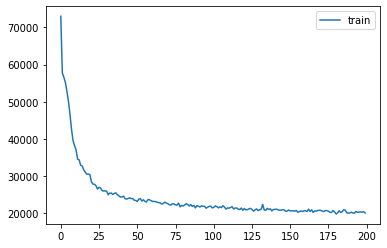

In [70]:
plt.plot(history_full_lstm_14.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case6/LSTM/loss.png")

plt.show()

89/89 [==============================] - 0s 781us/step
RMSE: 158.318356


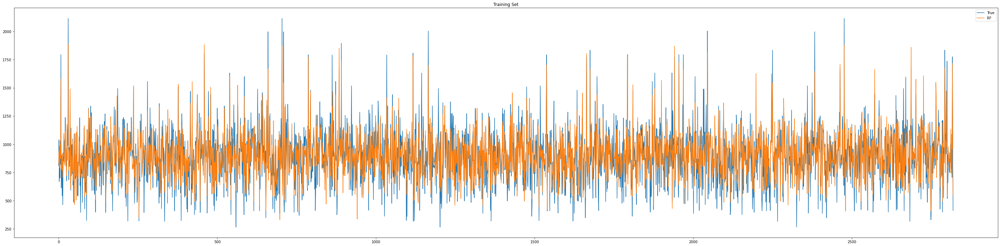

Training Set R-Square= 0.7005260449745878


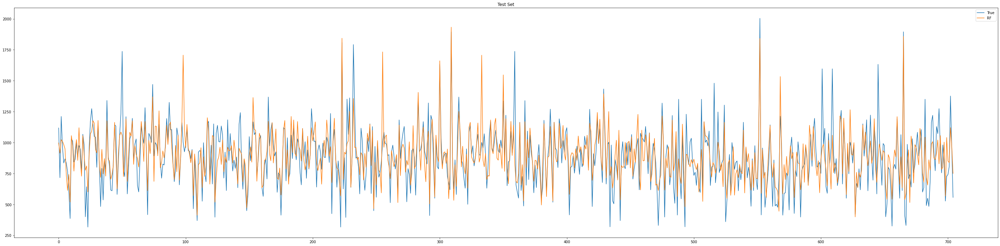

Test Set R-Square= 0.5909598168317376


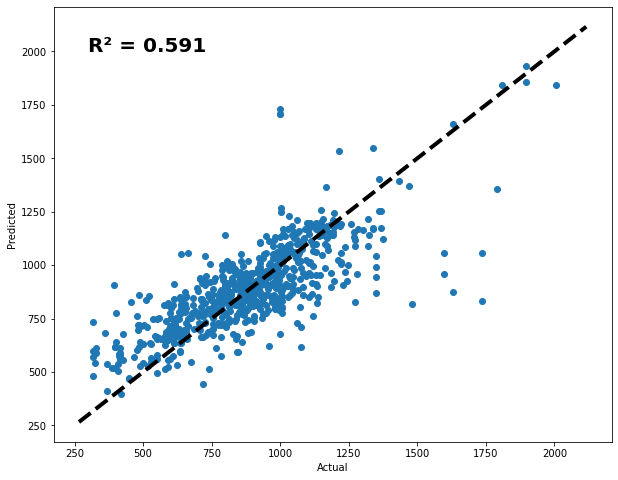

In [71]:
score = LSTM_full_14.evaluate(X_test_full_14, y_test_full_14, batch_size=1)

pred_lstm_full_14 = LSTM_full_14.predict(X_test_full_14) 
pred_train_lstm_full_14 = LSTM_full_14.predict(X_train_full_14)

rmse_lstm_full_14 = np.sqrt(mean_squared_error(y_test_full_14, pred_lstm_full_14)) 
print("RMSE: %f" % (rmse_lstm_full_14)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full_14))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full_14 ,pred_train_lstm_full_14)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full_14))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_full_14,pred_lstm_full_14)
print("Test Set R-Square=", rf_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_14, pred_lstm_full_14)
ax.plot([yield_full_14.min(), yield_full_14.max()], [yield_full_14.min(), yield_full_14.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_14, pred_lstm_full_14)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case6/LSTM/r2.png")
plt.show()



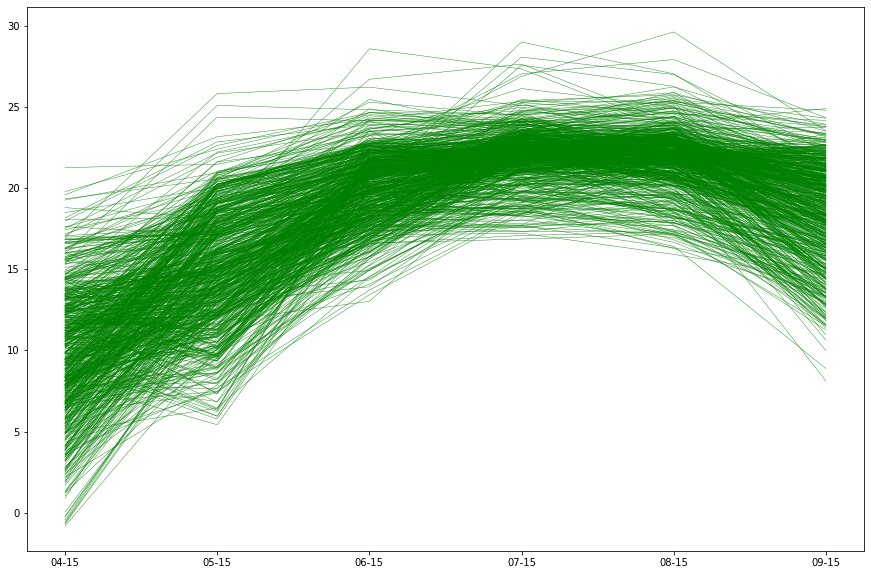

In [72]:
plt.figure(figsize=(15,10))
for i in range(X_test_full_14.shape[0]):
    plt.plot(df_filtered.index,X_test_full_14[i][:,6], 'g-', linewidth = 0.4)


## MLP

In [73]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

MLP_full_14 = Sequential()
MLP_full_14.add(Flatten(input_shape=(X_train_full_14.shape[1],X_train_full_14.shape[2])))
MLP_full_14.add(Dense(128, activation="relu"))
#MLP_full.add(Dropout(0.2))
MLP_full_14.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_14.add(Dense(8, activation="relu"))
MLP_full_14.add(Dense(1, activation="linear"))

MLP_full_14.compile(loss='mse', optimizer=Adam(lr=1e-3))#,decay=1e-3 / 200))

history_MLP_full_14 = MLP_full_14.fit(X_train_full_14, y_train_full_14, epochs=200, batch_size=1)


Epoch 1/200
2820/2820 [==============================] - 1s 446us/step - loss: 64857.6914
Epoch 2/200
2820/2820 [==============================] - 1s 429us/step - loss: 49276.0898
Epoch 3/200
2820/2820 [==============================] - 1s 410us/step - loss: 44256.0156
Epoch 4/200
2820/2820 [==============================] - 1s 507us/step - loss: 40467.0742
Epoch 5/200
2820/2820 [==============================] - 1s 448us/step - loss: 37511.6953
Epoch 6/200
2820/2820 [==============================] - 1s 429us/step - loss: 36232.2070
Epoch 7/200
2820/2820 [==============================] - 1s 425us/step - loss: 34809.4375
Epoch 8/200
2820/2820 [==============================] - 1s 427us/step - loss: 33836.3945
Epoch 9/200
2820/2820 [==============================] - 1s 430us/step - loss: 31710.3594
Epoch 10/200
2820/2820 [==============================] - 1s 428us/step - loss: 31298.5000
Epoch 11/200
2820/2820 [==============================] - 1s 458us/step - loss: 30093.6055
Epoch 12

23/23 [==============================] - 0s 294us/step
RMSE: 147.282436


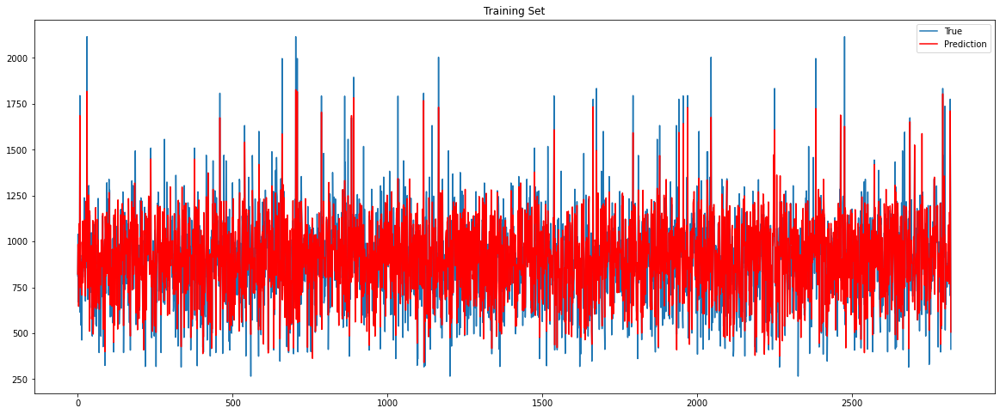

Training Set R-Square= 0.7267140163873818


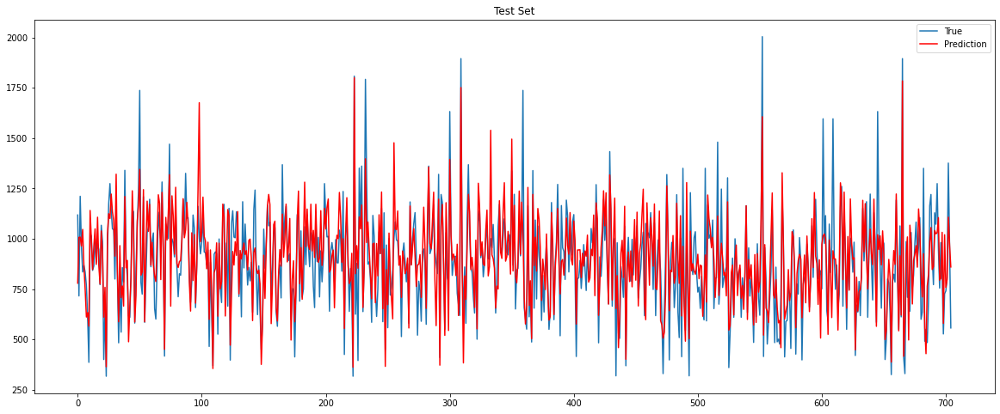

Test Set R-Square= 0.6459982985828708


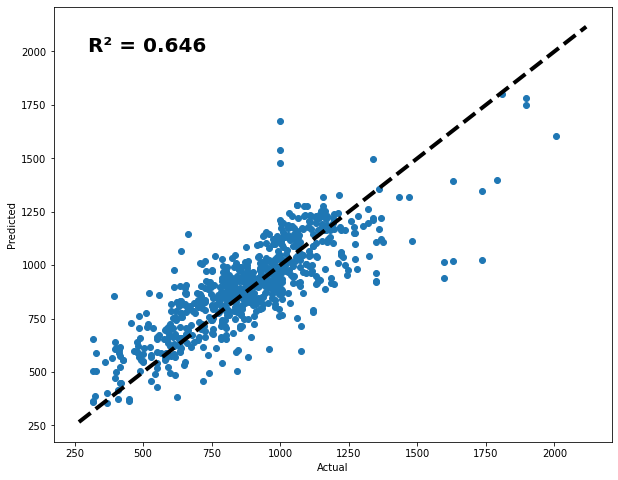

In [74]:
pred_train_mlp_full_14 = MLP_full_14.predict(X_train_full_14)
pred_test_mlp_full_14 = MLP_full_14.predict(X_test_full_14)

rmse_mlp_full_14 = np.sqrt(mean_squared_error(y_test_full_14, pred_test_mlp_full_14)) 
print("RMSE: %f" % (rmse_mlp_full_14)) 

plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full_14))
plt.plot(pred_train_mlp_full_14,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_full_14,pred_train_mlp_full_14)
print("Training Set R-Square=", mlp_indices_r2_train)


plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full_14))
plt.plot(pred_test_mlp_full_14,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_full_14,pred_test_mlp_full_14)
print("Test Set R-Square=", mlp_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_14, pred_test_mlp_full_14)
ax.plot([yield_full_14.min(), yield_full_14.max()], [yield_full_14.min(), yield_full_14.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_14, pred_test_mlp_full_14)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case6/MLP/r2.png")
plt.show()




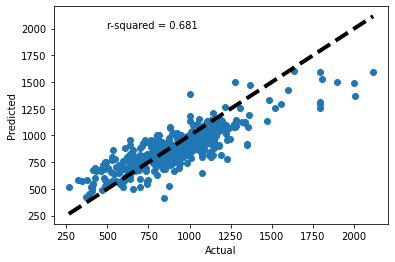

In [75]:
fig, ax = plt.subplots()
ax.scatter(y_test_full_16, pred_test_mlp_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("r-squared = {:.3f}".format(r2_score(y_test_full_16, pred_test_mlp_full_16)), (500, 2000))
plt.show()


## Random Forest

In [76]:
from sklearn.ensemble import RandomForestRegressor
regr_full_14 = RandomForestRegressor(n_estimators=100, criterion='squared_error',random_state=34,max_features=6)

regr_full_14.fit(X_train_full_14.reshape(X_train_full_14.shape[0],-1), y_train_full_14)

RandomForestRegressor(max_features=6, random_state=34)

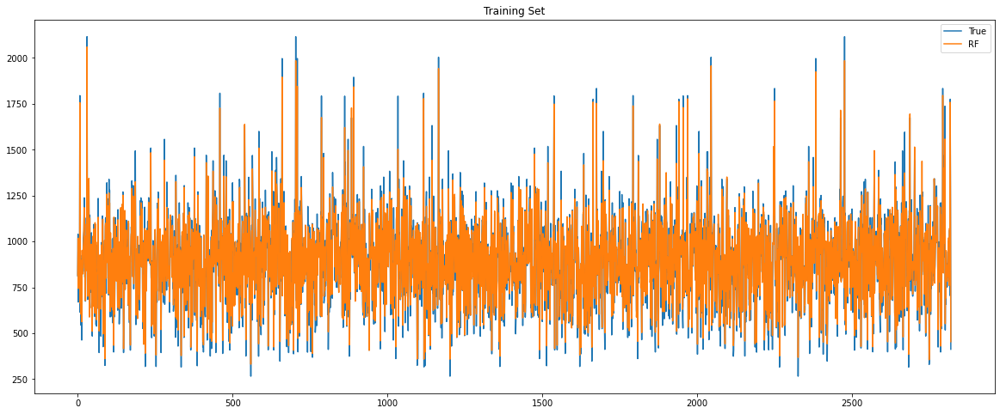

Training Set R-Square= 0.9681031353704983


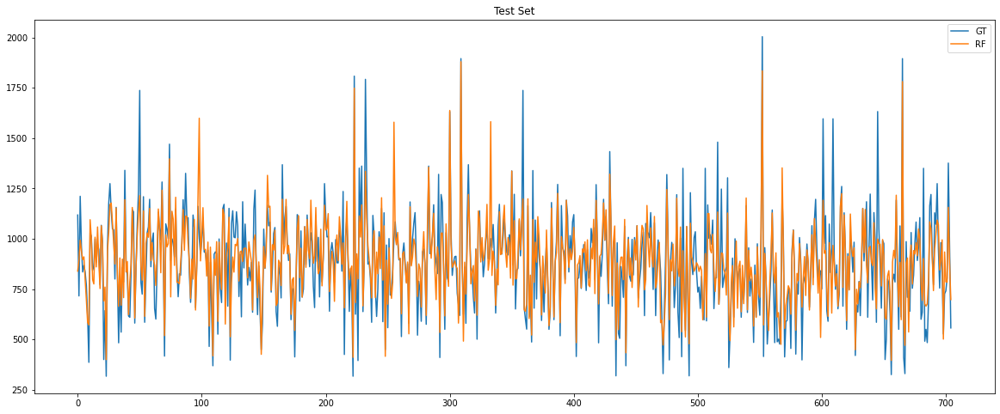

Test Set R-Square= 0.7333123107448274


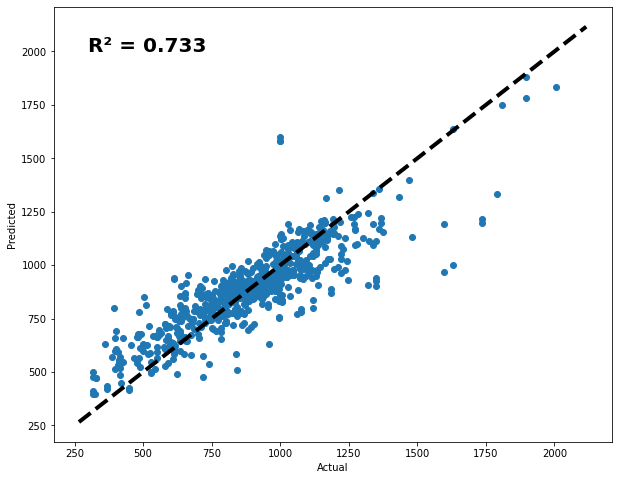

In [78]:
rf_pred_train_full_14 = regr_full_14.predict(X_train_full_14.reshape(X_train_full_14.shape[0],-1))
rf_pred_test_full_14 = regr_full_14.predict(X_test_full_14.reshape(X_test_full_14.shape[0],-1))

plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_full_14))
# plt.plot(pred_train_mlp)
plt.plot(rf_pred_train_full_14)

plt.title("Average WFV predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_full_14,rf_pred_train_full_14)
print("Training Set R-Square=", rf_indices_r2_train)

plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_full_14))
plt.plot(rf_pred_test_full_14)
plt.title("Average WFV predictions on test data")
plt.legend(["GT", "RF","MLP"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test = r2_score(y_test_full_14,rf_pred_test_full_14)
print("Test Set R-Square=", rf_indices_r2_test)


fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_14, rf_pred_test_full_14)
ax.plot([yield_full_14.min(), yield_full_14.max()], [yield_full_14.min(), yield_full_14.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_14, rf_pred_test_full_14)),(300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case6/RandomForest/r2.png")

plt.show()


## XGBOOST

In [79]:
xg_reg_full_14 = xgb.XGBRegressor(objective ='reg:squarederror') 
xg_reg_full_14.fit(X_train_full_14.reshape(X_train_full_14.shape[0],-1),y_train_full_14) 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

RMSE: 127.995970


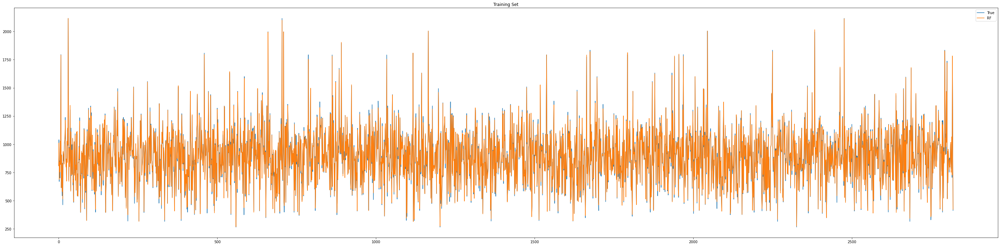

Training Set R-Square= 0.9952272284355286


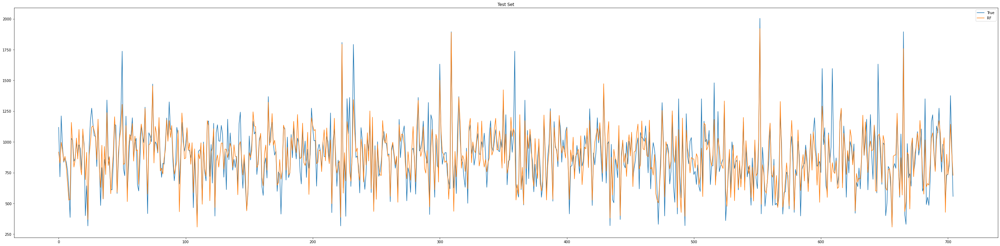

Test Set R-Square= 0.7326402527133506


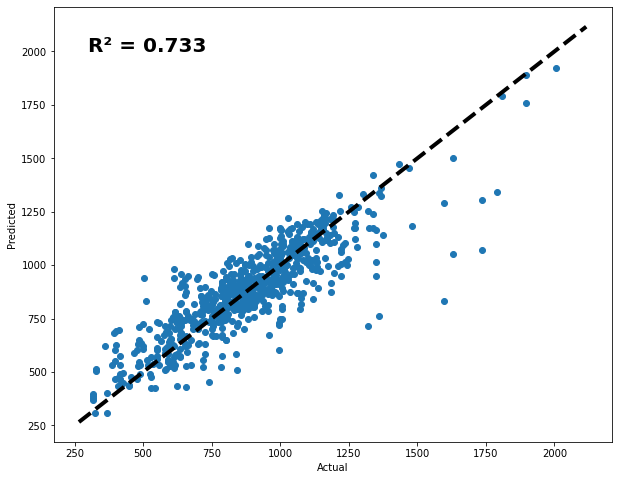

In [80]:
pred_xgb_full_14 = xg_reg_full_14.predict(X_test_full_14.reshape(X_test_full_14.shape[0],-1))
pred_train_xgb_full_14 = xg_reg_full_14.predict(X_train_full_14.reshape(X_train_full_14.shape[0],-1))

rmse_xgb_full = np.sqrt(mean_squared_error(y_test_full_14, pred_xgb_full_14)) 

print("RMSE: %f" % (rmse_xgb_full)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_full_14))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_full_14,pred_train_xgb_full_14)
print("Training Set R-Square=", rf_indices_r2_train_full)

plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_full_14))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_full_14,pred_xgb_full_14)
print("Test Set R-Square=", rf_indices_r2_test_full)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_full_14, pred_xgb_full_14)
ax.plot([yield_full_14.min(), yield_full_14.max()], [yield_full_14.min(), yield_full_14.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_full_14, pred_xgb_full_14)), (300, 2000),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case6/xgboost/r2.png")
plt.show()


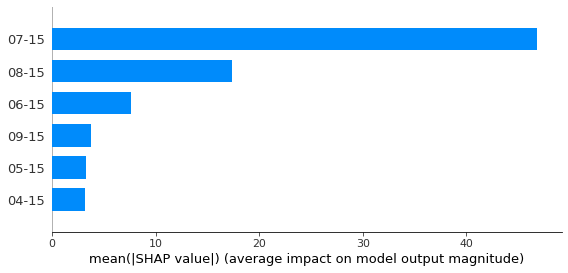

In [81]:
import shap

explainer_xgb_full_14 = shap.Explainer(xg_reg_full_14)
X_test_full_reshaped_14 = X_test_full_14.reshape((X_test_full_14.shape[0], -1))
shap_values_xgb_full_14 = explainer_xgb_full_14.shap_values(X_test_full_reshaped_14)

shap_values_reshaped_14 = shap_values_xgb_full_14.reshape((X_test_full_14.shape[0], 6, -1))


shap.summary_plot(shap_values_reshaped_14[:,:,0], X_test_full_14[:,:,0], plot_type="bar", feature_names=df_filtered.index)

# Results

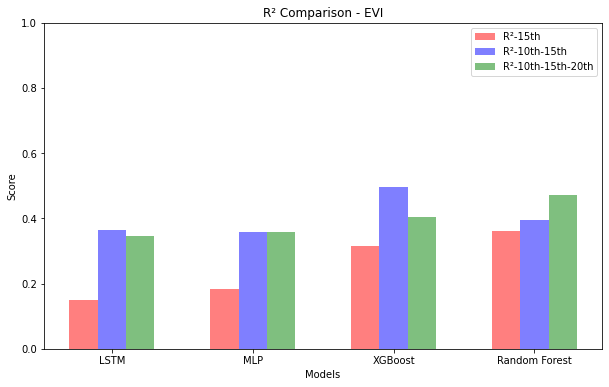

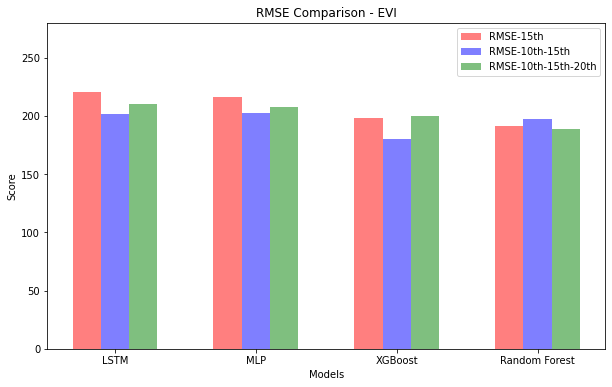

In [181]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate performance metrics for each model
r2_scores_evi_15 = [r2_score(y_test_evi, pred_lstm_evi),
                 r2_score(y_test_evi, pred_test_mlp),
                 r2_score(y_test_evi, pred_xgb),
                 r2_score(y_test_evi, rf_pred_test)]

rmse_scores_evi_15 = [np.sqrt(mean_squared_error(y_test_evi, pred_lstm_evi)),
                   np.sqrt(mean_squared_error(y_test_evi, pred_test_mlp)),
                   np.sqrt(mean_squared_error(y_test_evi, pred_xgb)),
                   np.sqrt(mean_squared_error(y_test_evi, rf_pred_test))]


r2_scores_evi_16 = [r2_score(y_test_evi_16, pred_lstm_evi_16),
                 r2_score(y_test_evi_16, pred_test_mlp_16),
                 r2_score(y_test_evi_16, pred_xgb_16),
                 r2_score(y_test_evi_16, rf_pred_test_16)]

rmse_scores_evi_16 = [np.sqrt(mean_squared_error(y_test_evi_16, pred_lstm_evi_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, pred_test_mlp_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, pred_xgb_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, rf_pred_test_16))]

r2_scores_evi_14 = [r2_score(y_test_evi_14, pred_lstm_evi_14),
                 r2_score(y_test_evi_14, pred_test_mlp_14),
                 r2_score(y_test_evi_14, pred_xgb_14),
                 r2_score(y_test_evi_14, rf_pred_test_14)]

rmse_scores_evi_14 = [np.sqrt(mean_squared_error(y_test_evi_14, pred_lstm_evi_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, pred_test_mlp_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, pred_xgb_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, rf_pred_test_14))]

# Model labels
model_labels = ['LSTM', 'MLP', 'XGBoost', 'Random Forest']

# Create bar plots
fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, r2_scores_evi_15, align='center', width=0.2, alpha=0.5, color='red', label='R²-15th')
ax.bar(x_pos, r2_scores_evi_16, align='center', width=0.2, alpha=0.5, color='blue', label='R²-10th-15th')
ax.bar(x_pos+0.2, r2_scores_evi_14, align='center',  width=0.2,alpha=0.5, color='green', label='R²-10th-15th-20th')
ax.set_ylim(0, 1)

ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('R² Comparison - EVI')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/r2_evi.png")
plt.show()



fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, rmse_scores_evi_15, align='center',  width=0.2,alpha=0.5, color='red', label='RMSE-15th')
ax.bar(x_pos, rmse_scores_evi_16, align='center', width=0.2, alpha=0.5, color='blue', label='RMSE-10th-15th')
ax.bar(x_pos+0.2, rmse_scores_evi_14, align='center', width=0.2, alpha=0.5, color='green', label='RMSE-10th-15th-20th')


ax.set_ylabel('Score')
ax.set_ylim(0, 280)

ax.set_xlabel('Models')
ax.set_title('RMSE Comparison - EVI')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/rmse_evi.png")
plt.show()


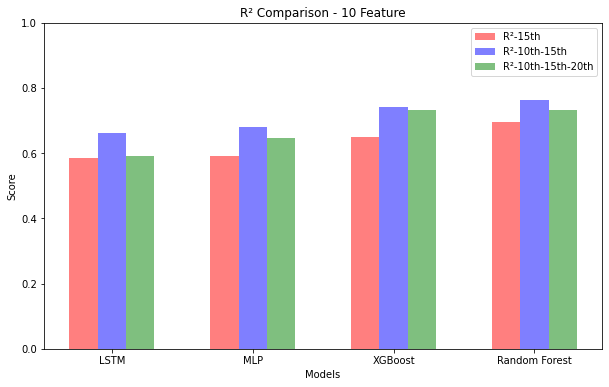

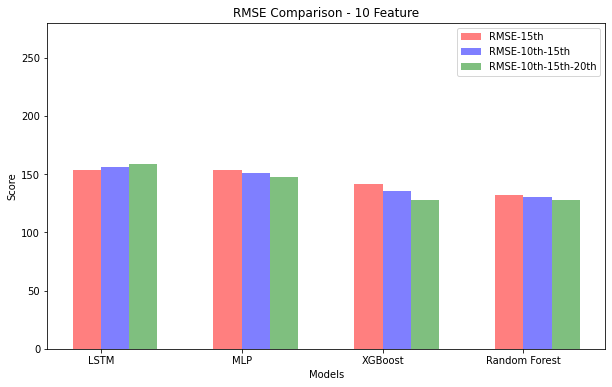

In [82]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate performance metrics for each model
r2_scores_full_15 = [r2_score(y_test_full, pred_lstm_full),
                 r2_score(y_test_full, pred_test_mlp_full),
                 r2_score(y_test_full, pred_xgb_full),
                 r2_score(y_test_full, rf_pred_test_full)]

rmse_scores_full_15 = [np.sqrt(mean_squared_error(y_test_full, pred_lstm_full)),
                   np.sqrt(mean_squared_error(y_test_full, pred_test_mlp_full)),
                   np.sqrt(mean_squared_error(y_test_full, pred_xgb_full)),
                   np.sqrt(mean_squared_error(y_test_full, rf_pred_test_full))]


r2_scores_full_16 = [r2_score(y_test_full_16, pred_lstm_full_16),
                 r2_score(y_test_full_16, pred_test_mlp_full_16),
                 r2_score(y_test_full_16, pred_xgb_full_16),
                 r2_score(y_test_full_16, rf_pred_test_full_16)]

rmse_scores_full_16 = [np.sqrt(mean_squared_error(y_test_full_16, pred_lstm_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, pred_test_mlp_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, pred_xgb_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, rf_pred_test_full_16))]

r2_scores_full_14 = [r2_score(y_test_full_14, pred_lstm_full_14),
                 r2_score(y_test_full_14, pred_test_mlp_full_14),
                 r2_score(y_test_full_14, pred_xgb_full_14),
                 r2_score(y_test_full_14, rf_pred_test_full_14)]

rmse_scores_full_14 = [np.sqrt(mean_squared_error(y_test_full_14, pred_lstm_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, pred_test_mlp_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, pred_xgb_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, rf_pred_test_full_14))]
# Model labels
model_labels = ['LSTM', 'MLP', 'XGBoost', 'Random Forest']

# Create bar plots
fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, r2_scores_full_15, align='center',  width=0.2, alpha=0.5, color='red', label='R²-15th')
ax.bar(x_pos, r2_scores_full_16, align='center',  width=0.2, alpha=0.5, color='blue', label='R²-10th-15th')
ax.bar(x_pos+0.2, r2_scores_full_14, align='center',  width=0.2, alpha=0.5, color='green', label='R²-10th-15th-20th')
ax.set_ylim(0, 1)

ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('R² Comparison - 10 Feature')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/r2_full.png")
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, rmse_scores_full_15, align='edge', width=0.2, alpha=0.5, color='red', label='RMSE-15th')
ax.bar(x_pos, rmse_scores_full_16, align='edge', width=0.2, alpha=0.5, color='blue', label='RMSE-10th-15th')
ax.bar(x_pos+0.2, rmse_scores_full_14, align='edge',  width=0.2, alpha=0.5, color='green', label='RMSE-10th-15th-20th')
ax.set_ylim(0, 280)


ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('RMSE Comparison - 10 Feature')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/rmse_full.png")
plt.show()


In [83]:
data = {
    'Model': ['LSTM', 'MLP', 'XGB', 'Random Forest'],
    'RMSE (Full 15)': rmse_scores_full_15,
    'RMSE (Full 10)': rmse_scores_full_16,
    'RMSE (Full 20)': rmse_scores_full_14,
    'R2 Score (Full 15)': r2_scores_full_15,
    'R2 Score (Full 10)': r2_scores_full_16,
    'R2 Score (Full 20)': r2_scores_full_14
}

# Create a DataFrame from the data dictionary
df = pd.DataFrame(data)

# Set the 'Model' column as the index
df.set_index('Model', inplace=True)

# Display the table
df.head()

,RMSE (Full 15),RMSE (Full 10),RMSE (Full 20),R2 Score (Full 15),R2 Score (Full 10),R2 Score (Full 20)
Model,,,,,,
LSTM,153.905058,155.795160,158.318356,0.586412,0.660327,0.590960
MLP,153.304831,151.055464,147.282436,0.589631,0.680680,0.645998
XGB,141.586718,135.690695,127.995970,0.649968,0.742337,0.732640
Random Forest,132.408041,130.104721,127.834998,0.693880,0.763114,0.733312


In [184]:
r2_data_evi = {
    'Model': ['LSTM', 'MLP', 'XGB', 'RF'],
    'R2_15': r2_scores_evi_15,
    'R2_10': r2_scores_evi_16,
    'R2_20': r2_scores_evi_14
}

rmse_data_evi = {
    'Model': ['LSTM', 'MLP', 'XGB', 'RF'],
    'RMSE_15': rmse_scores_evi_15,
    'RMSE_10': rmse_scores_evi_16,
    'RMSE_20': rmse_scores_evi_14
}

# Create DataFrames from the data - evi
r2_df_evi = pd.DataFrame(r2_data_evi)
rmse_df_evi = pd.DataFrame(rmse_data_evi)

In [185]:
r2_df_evi

,Model,R2_15,R2_10,R2_20
0,LSTM,0.150970,0.365225,0.345426
1,MLP,0.182635,0.359423,0.357031
2,XGB,0.316470,0.494905,0.404741
3,RF,0.361006,0.394108,0.471077


In [186]:
rmse_df_evi

,Model,RMSE_15,RMSE_10,RMSE_20
0,LSTM,220.511077,201.850881,209.725587
1,MLP,216.359924,202.771191,207.858096
2,XGB,197.855223,180.055876,199.997721
3,RF,191.300904,197.205182,188.524762


# Alabama

In [187]:
df_list_alabama = []
yield_list_alabama = []
evi_list_alabama = []
raw_list_alabama = []
i = 0

#scaler_full = Robust_scale()
state = 'alabama'

for city in dataset_dict[state]:
    for dataset_number in range(5):
            df_all_alabama = datasets[dataset_number][state][city]['dynamic']
            yield_data = datasets[dataset_number][state][city]['yield']
            df_all_alabama.index = pd.to_datetime(df_all_alabama.index)
            df_all_alabama = df_all_alabama.sort_index(ascending=True)
            df_all_alabama = df_all_alabama.drop('lst_day', axis=1)
            try:
                df_all_alabama = df_all_alabama.drop('yield', axis=1)
                for idx in range(1,12):
                    df_all_alabama = df_all_alabama.drop(f'sf_{idx}',axis=1)
            except:
                pass
            df_all_alabama = df_all_alabama.drop('lst_nigth', axis=1)
            df_all_alabama = df_all_alabama.drop('dayl', axis=1)


            df_all_alabama = df_all_alabama.interpolate()
            df_monthly_alabama = df_all_alabama[(df_all_alabama.index.month >= 4) & (df_all_alabama.index.month <= 9)]

            df_dayly_alabama = df_monthly_alabama[(df_monthly_alabama.index.day == 14)]
            df_dayly_alabama.index = pd.to_datetime(df_dayly_alabama.index, format = '%Y-%m-%d').strftime('%m-%d')
            df_dayly_alabama['evi'] = df_dayly_alabama['evi'].astype(np.float64)
            df_dayly_alabama['lai'] = df_dayly_alabama['lai'].astype(np.float64)
            df_dayly_alabama['fpar'] = df_dayly_alabama['fpar'].astype(np.float64)
            df_dayly_alabama['ssm'] = df_dayly_alabama['ssm'].astype(np.float64)
            df_dayly_alabama['susm'] = df_dayly_alabama['susm'].astype(np.float64)

            if all(0 <= x <= 1 for x in df_dayly_alabama.iloc[:, 0]):


            #df_dayly_alabama = df_dayly_alabama[(df_dayly_alabama['evi'] >= 0) & (df_dayly_alabama['evi'] <= 1)]
            #df_dayly_alabama = df_dayly_alabama[(df_dayly_alabama['ssm'] >= 0) & (df_dayly_alabama['ssm'] <= 1)]
            #df_dayly_alabama = df_dayly_alabama[(df_dayly_alabama['tmax'] >= 0) & (df_dayly_alabama['tmax'] <= 50)]


                df_filtered_alabama = df_dayly_alabama.select_dtypes(include=['float64', 'int64'])  
                #scaler = RobustScaler()
                #scaler.fit(df_filtered_alabama)
               # df_scaled = pd.DataFrame(scaler_full.transform(df_filtered_alabama), columns=df_filtered_alabama.columns)

                # Scale the input data

                raw_list_alabama.append(df_filtered_alabama)
                df_list_alabama.append(df_filtered_alabama)
                yield_list_alabama.append(yield_data)
                evi_list_alabama.append(df_filtered_alabama.evi)


df_full_alabama = np.stack(df_list_alabama)
yield_full_alabama = np.stack(yield_list_alabama)
evi_full_alabama = np.stack(evi_list_alabama)
raw_full_alabama = np.stack(raw_list_alabama)
print("DFs Shape: ",df_full_alabama.shape)
print("Yields Shape: ", yield_full_alabama.shape)
print("EVIs Shape: ", evi_full_alabama.shape)

DFs Shape:  (80, 6, 10)
Yields Shape:  (80,)
EVIs Shape:  (80, 6)


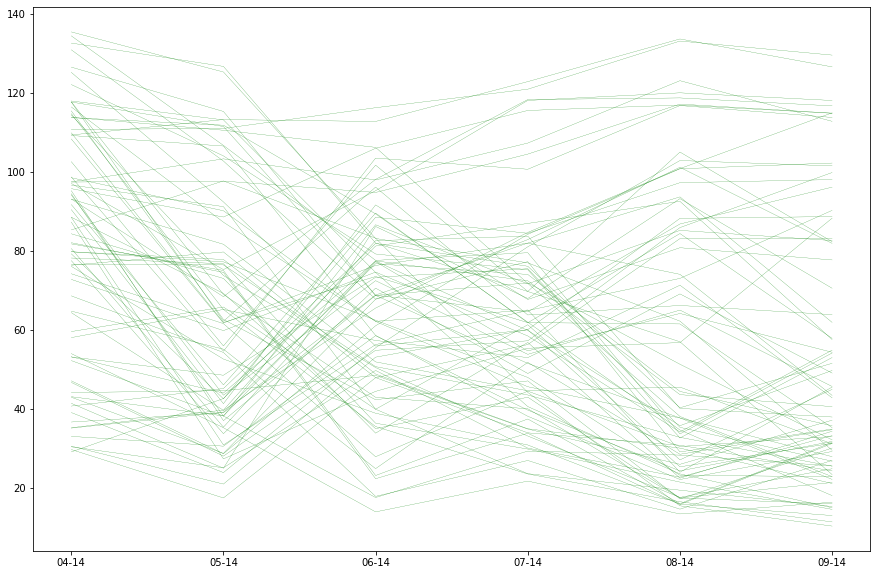

In [188]:
plt.figure(figsize=(15,10))
for i in range(df_full_alabama.shape[0]):
    plt.plot(df_filtered_alabama.index.values , df_full_alabama[i][:,9], 'g-', linewidth = 0.2)


In [189]:
name_key_counts = {}

for name, dictionary in dataset_dict.items():
    name_key_counts[name] = len(dictionary)

print(name_key_counts)


{'alabama': 19, 'arizona': 4, 'arkansas': 13, 'california': 3, 'georgia': 42, 'kansas': 2, 'louisiana': 7, 'mississippi': 21, 'new mexico': 2, 'north carolina': 19, 'oklahoma': 11, 'south carolina': 14, 'tennessee': 10, 'texas': 68}
